# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".


```
floyd login
floyd init face-generation
floyd run --gpu --env tensorflow --mode jupyter --data diSgciLH4WA7HpcHNasP9j
```

In [1]:
#for local computer or virtual machine (google cloud, AWS etc), use data folder
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

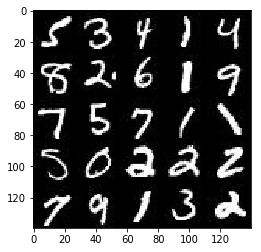

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

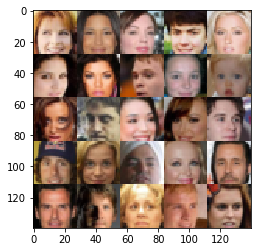

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0


/home/edwardshyu/anaconda3/envs/tf1_1_cpu/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width,image_height, image_channels), name="input_real")
    input_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [8]:
def leaky_relu(x, alpha=0.2):
    return tf.maximum(alpha * x, x)

def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha=0.2
        
        #Input 28x28x3
        conv1 = tf.layers.conv2d(inputs=images,
                                 filters=64,
                                 kernel_size=3,
                                 strides=2,
                                 padding='same')
        '''
        first layer doesn't use batch normalization because we've already
        normalized the input images
        '''
        activ1 = leaky_relu(conv1, alpha)
        #layer 1 output is 14 x 14 x 64
        
        conv2 = tf.layers.conv2d(inputs=activ1,
                                 filters=128,
                                 kernel_size=3,
                                 strides=2,
                                 padding='same')
        norm2 = tf.layers.batch_normalization(inputs=conv2, training=True)
        activ2 = leaky_relu(norm2, alpha)
        #layer 2 output is 7 x 7 x 128
        
        conv3 = tf.layers.conv2d(inputs=activ2,
                                 filters=256,
                                 kernel_size=3,
                                 strides=1,
                                 padding='same')
        norm3 = tf.layers.batch_normalization(inputs=conv3, training=True)
        activ3 = leaky_relu(norm3, alpha)
        #layer 3 output is 7 x 7 x 256
        
        ''' 
        flatten tensor to one row, columns equals num of elements in 3rd conv layer,
        which is 7 * 7 * 256;
        Technically, the first dimension will be more than one row
        because we're passing in batches of more than one image,
        so the first dimension should equal the batch size
        '''
        flat = tf.reshape(tensor=activ3, shape=[-1,7*7*256])
        
        #fully connected layer outputs just 1 scalar, 1 for real images, 0 for fake images
        logits = tf.layers.dense(inputs=flat, units=1)
        out = tf.sigmoid(logits)
        
    '''
    return both the 'out' prediction and the logits
    before applying activation.  
    This is because when we apply cross entropy, it's more efficient
    to combine it with the sigmoid activation, so we'll use a function 
    that combines both in one function: 
    tf.nn.sigmoid_cross_entropy_with_logits
    '''    
    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    '''
    When we are training, we do not reuse the variables; we start with fresh random variables.
    When we are not training, but testing, we want to re-use the variable and weights
    that were found previously during training.
    '''
    reuse = not is_train
    alpha=0.2
    with tf.variable_scope('generator', reuse=reuse):
        '''
        Start by passing the input noise thru fully connected layer,
        so that we can start with the desired number of units
        '''
        dense1 = tf.layers.dense(inputs=z, units=7*7*512)
        #create first conv layer: batch size x width x height x channels
        conv1 = tf.reshape(tensor=dense1, shape=[-1,7,7,512])
        norm1 = tf.layers.batch_normalization(inputs=conv1, training=is_train)
        activ1 = leaky_relu(norm1, alpha)
        #size: 7 x 7 x 512
        
        '''
        up-sampling to increase width and height
        Convolution transpose increases the width and height of output
        by a factor of stride size.
        '''
        conv2 = tf.layers.conv2d_transpose(inputs=activ1,
                                           filters=256,
                                           kernel_size=3,
                                           strides=2,
                                           padding='same')
        norm2 = tf.layers.batch_normalization(inputs=conv2, training=is_train)
        activ2 = leaky_relu(norm2, alpha)
        #size: 14 x 14 x 256
        
        conv3 = tf.layers.conv2d_transpose(inputs=activ2,
                                           filters=128,
                                           kernel_size=3,
                                           strides=2,
                                           padding='same')
        norm3 = tf.layers.batch_normalization(inputs=conv3, training=is_train)
        activ3 = leaky_relu(norm3, alpha)
        #size 28 x 28 x 128
        
        
        #output layer (filters should be 3, for rgb channels)
        logits = tf.layers.conv2d_transpose(inputs=activ3,
                                            filters=out_channel_dim,
                                            kernel_size=3,
                                            strides=1,
                                            padding='same')
        
        #size: 28 x 28 x 3: same shape as the real images
        #output ranges from -1 to 1, so use tanh
        out = tf.tanh(logits)
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    '''
    The generator is training, and does not reuse the variables (starts with fresh weights)
    The discriminator views real images and does not reuse variables.
    The discriminator views fake images and reuses variables that are being used when training on real images
    '''
    g_model = generator(z=input_z,
                        out_channel_dim=out_channel_dim,
                        is_train=True)
    d_model_real, d_logits_real = discriminator(images=input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(images=g_model, reuse=True)
    '''
    We can use sigmoid and not softmax here because it's just a single unit output 
    between 0 and 1; softmax would give us the same thing, but it's only needed when there
    are more than one classes (output units), because we want all the outputs to sum to 100%
    
    For generator, its goal is to make its fake output be labeled as ones (as real images).
    
    For the discriminator, its goal is to label real images as 1, and generator images as 0.
    For real images, labels should be ones. d_model_real and d_logits_real have the same shape, 
    so we can use either to create the labels; it's more clear to use d_model_real, because it's
    the sigmoid output between 0 and 1, and the labels should also be between 0 and 1
    '''
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake))
    )
    
    '''
    For the discriminator, when viewing real images, make the target less than 1 to make it less stringent.
    The generator will still try to target 1
    '''
    smooth=0.1
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-smooth)))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    
    '''
    We want the discriminator's optimizer to only train the discriminator variables,
    likewise, the generator optimizer only modifies the generator variables
    '''
    tvars = tf.trainable_variables()
    d_vars = [var for var in tvars if var.name.startswith('discriminator')]
    g_vars = [var for var in tvars if var.name.startswith('generator')]
    
    '''
    Use control_dependencies so that batch normalization can update their population statistics.
    
    '''
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate,
                                             beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate,
                                             beta1=beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        #model_inputs(image_width, image_height, image_channels, z_dim)
        self.input_real, self.input_z, learning_rate_ = model_inputs(image_width=real_size[0],image_height=real_size[1],image_channels=real_size[2],z_dim=z_size)
        
        #model_loss(input_real, input_z, out_channel_dim)
        self.d_loss, self.g_loss = model_loss(input_real=self.input_real,
                                              input_z=self.input_z,
                                              out_channel_dim=real_size[2])
        
        #model_opt(d_loss, g_loss, learning_rate, beta1)
        self.d_opt, self.g_opt = model_opt(d_loss=self.d_loss,
                                           g_loss=self.g_loss,
                                           learning_rate=learning_rate,
                                           beta1=beta1)

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [14]:
def scale(x):
    """
    scale from -0.5 to +0.5 
    to -1.0 to +1.0
    """
    return x*2

In [15]:
def train(gan, epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """

    
    '''
    re-use the same generator input when checking the progress of training with sample output images
    
    data_shape for mnist looks like:
    (60000, 28, 28, 1)
    batch_size, width, height, channels
    use data_shape[3] to get the channel size
    '''
    sample_z = np.random.uniform(-1, 1, size=(72, z_dim))
    samples, losses = [], []
    steps=0
    n_images = 12 # num of generated images to show when checking progress
    out_channel_dim = data_shape[3]
    print_every=10
    show_every=20
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver = tf.train.Saver()
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                #make the real image data range between -1 and 1, like the fake images
                batch_images = scale(batch_images)
                steps +=1
                #input for generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                #optimizers
                '''
                Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. 
                The generator doesn't actually use it, 
                but we'd get an error without it because of the `tf.control_dependencies` block 
                we created in `model_opt`. 
                '''
                _ = sess.run(gan.d_opt, feed_dict={gan.input_real: batch_images, gan.input_z: batch_z})
                _ = sess.run(gan.g_opt, feed_dict={gan.input_z: batch_z, gan.input_real: batch_images})
                
                if steps % print_every == 0:
                    train_loss_d = sess.run(gan.d_loss, feed_dict={gan.input_z: batch_z, gan.input_real: batch_images})
                    train_loss_g = sess.run(gan.g_loss, feed_dict={gan.input_z: batch_z})
                    
                    print("Epoch {}/{}".format(epoch_i+1, epoch_count),
                          "Discriminator loss {:.4f}".format(train_loss_d),
                          "Generator loss {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d,train_loss_g))
                    
                if steps % show_every == 0:
                    show_generator_output(sess=sess,
                                          n_images=n_images,
                                          input_z=gan.input_z,
                                          out_channel_dim=out_channel_dim,
                                          image_mode=data_image_mode)
        saver.save(sess, "./checkpoints/generator.ckpt")
        
    with open("samples.pkl", "wb") as f:
        pkl.dump(samples,f)
        
    return losses, samples

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 Discriminator loss 1.6421 Generator loss 0.3825
Epoch 1/2 Discriminator loss 1.5922 Generator loss 1.4898


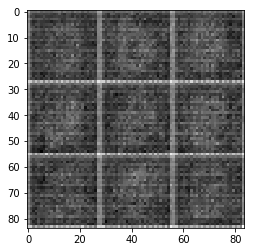

Epoch 1/2 Discriminator loss 1.2410 Generator loss 1.9393
Epoch 1/2 Discriminator loss 1.2725 Generator loss 0.8792


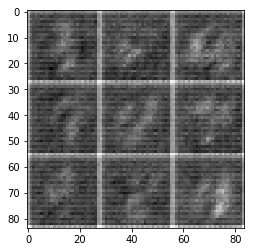

Epoch 1/2 Discriminator loss 1.0842 Generator loss 1.6186
Epoch 1/2 Discriminator loss 0.7314 Generator loss 0.9368


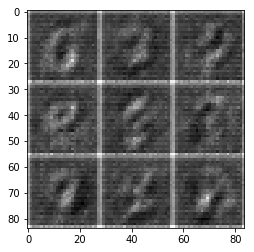

Epoch 1/2 Discriminator loss 0.5176 Generator loss 1.5354
Epoch 1/2 Discriminator loss 0.4458 Generator loss 1.2768


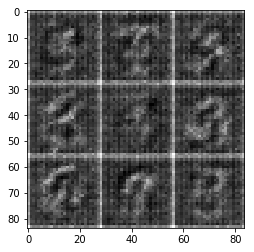

Epoch 1/2 Discriminator loss 0.2538 Generator loss 1.9100
Epoch 1/2 Discriminator loss 0.1587 Generator loss 2.2203


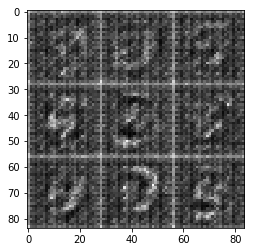

Epoch 1/2 Discriminator loss 0.1423 Generator loss 2.3922
Epoch 1/2 Discriminator loss 0.0654 Generator loss 4.0086


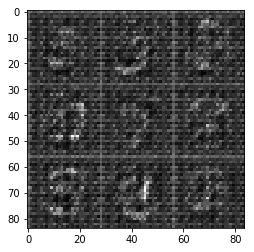

Epoch 1/2 Discriminator loss 0.2002 Generator loss 1.8506
Epoch 1/2 Discriminator loss 0.0598 Generator loss 3.4170


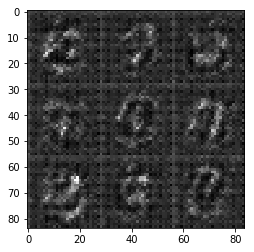

Epoch 1/2 Discriminator loss 0.0706 Generator loss 3.1438
Epoch 1/2 Discriminator loss 0.0465 Generator loss 3.4832


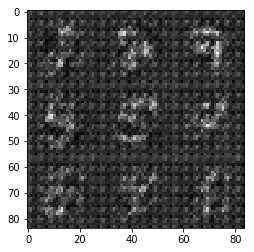

Epoch 1/2 Discriminator loss 0.3413 Generator loss 4.1495
Epoch 1/2 Discriminator loss 0.2269 Generator loss 2.1340


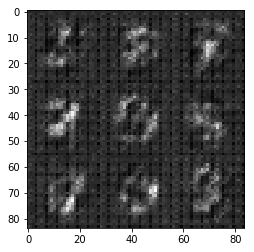

Epoch 1/2 Discriminator loss 0.0865 Generator loss 3.7356
Epoch 1/2 Discriminator loss 0.0496 Generator loss 5.2440


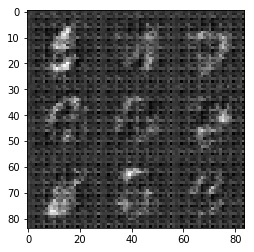

Epoch 1/2 Discriminator loss 0.0378 Generator loss 5.4804
Epoch 1/2 Discriminator loss 0.0975 Generator loss 2.8256


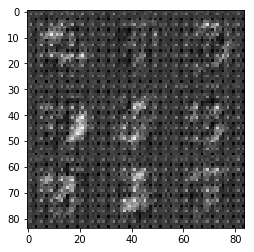

Epoch 1/2 Discriminator loss 1.2762 Generator loss 8.0262
Epoch 1/2 Discriminator loss 0.0488 Generator loss 6.0039


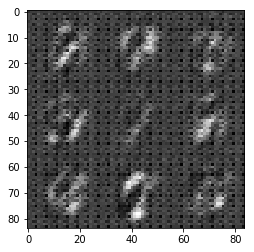

Epoch 1/2 Discriminator loss 0.0785 Generator loss 2.9014
Epoch 1/2 Discriminator loss 0.0714 Generator loss 4.1042


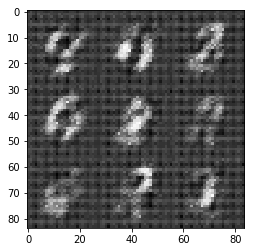

Epoch 1/2 Discriminator loss 0.6868 Generator loss 6.1399
Epoch 1/2 Discriminator loss 0.6219 Generator loss 1.2668


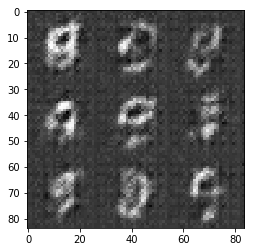

Epoch 1/2 Discriminator loss 0.1051 Generator loss 4.1855
Epoch 1/2 Discriminator loss 0.3833 Generator loss 1.5113


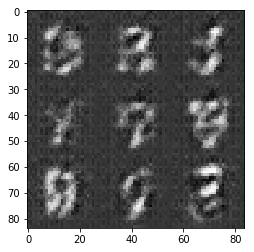

Epoch 1/2 Discriminator loss 0.1647 Generator loss 2.3901
Epoch 1/2 Discriminator loss 0.0708 Generator loss 3.9364


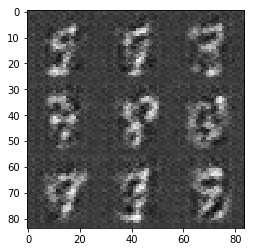

Epoch 1/2 Discriminator loss 0.3373 Generator loss 1.7412
Epoch 1/2 Discriminator loss 0.0999 Generator loss 3.1254


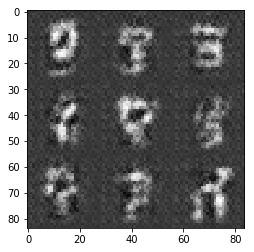

Epoch 1/2 Discriminator loss 0.1215 Generator loss 3.7446
Epoch 1/2 Discriminator loss 0.1363 Generator loss 2.7194


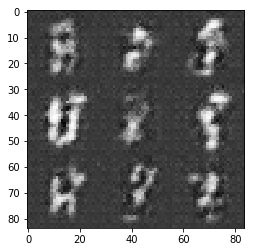

Epoch 1/2 Discriminator loss 2.5453 Generator loss 0.0983
Epoch 1/2 Discriminator loss 0.1931 Generator loss 2.4142


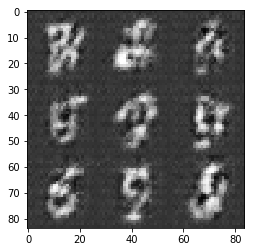

Epoch 1/2 Discriminator loss 0.0985 Generator loss 3.3690
Epoch 1/2 Discriminator loss 0.4130 Generator loss 5.1172


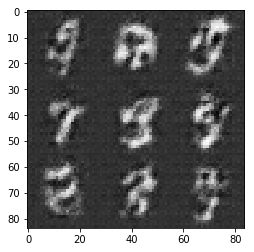

Epoch 1/2 Discriminator loss 0.1313 Generator loss 2.6238
Epoch 1/2 Discriminator loss 0.0539 Generator loss 4.6268


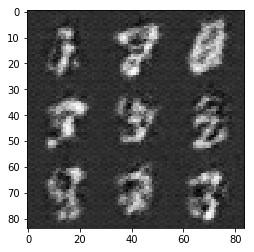

Epoch 1/2 Discriminator loss 0.0907 Generator loss 3.0578
Epoch 1/2 Discriminator loss 0.1120 Generator loss 2.8746


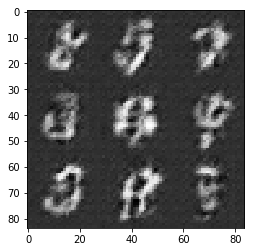

Epoch 1/2 Discriminator loss 0.0418 Generator loss 4.7093
Epoch 1/2 Discriminator loss 0.2270 Generator loss 2.4118


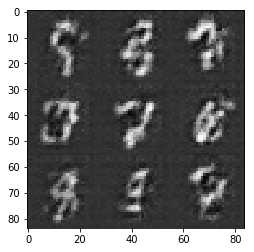

Epoch 2/2 Discriminator loss 0.1781 Generator loss 2.2915
Epoch 2/2 Discriminator loss 0.1172 Generator loss 2.7927


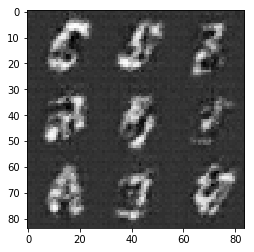

Epoch 2/2 Discriminator loss 0.1245 Generator loss 2.6750
Epoch 2/2 Discriminator loss 0.1028 Generator loss 2.8827


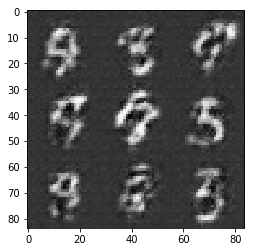

Epoch 2/2 Discriminator loss 0.1192 Generator loss 2.6510
Epoch 2/2 Discriminator loss 0.1548 Generator loss 2.3428


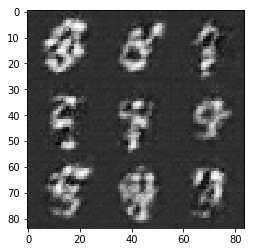

Epoch 2/2 Discriminator loss 0.1514 Generator loss 2.3164
Epoch 2/2 Discriminator loss 0.0634 Generator loss 3.7328


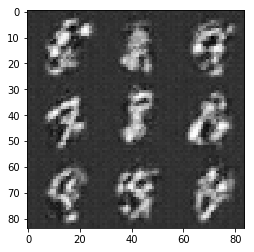

Epoch 2/2 Discriminator loss 0.3249 Generator loss 3.3169
Epoch 2/2 Discriminator loss 0.2206 Generator loss 2.2690


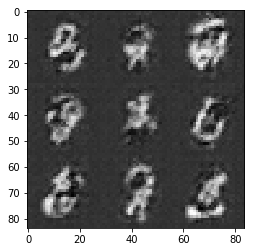

Epoch 2/2 Discriminator loss 0.1297 Generator loss 2.8993
Epoch 2/2 Discriminator loss 0.1574 Generator loss 2.4833


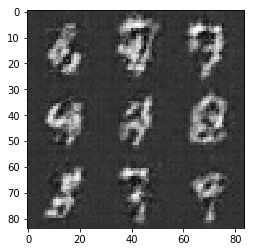

Epoch 2/2 Discriminator loss 0.0757 Generator loss 3.5092
Epoch 2/2 Discriminator loss 0.2996 Generator loss 1.6527


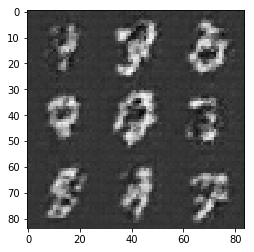

Epoch 2/2 Discriminator loss 0.0878 Generator loss 3.2734
Epoch 2/2 Discriminator loss 0.1720 Generator loss 2.3348


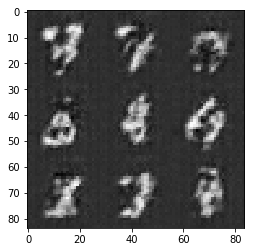

Epoch 2/2 Discriminator loss 0.0315 Generator loss 4.7366
Epoch 2/2 Discriminator loss 0.0541 Generator loss 4.0469


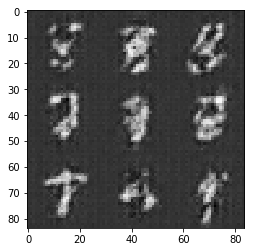

Epoch 2/2 Discriminator loss 0.0702 Generator loss 3.4105
Epoch 2/2 Discriminator loss 0.0445 Generator loss 4.1808


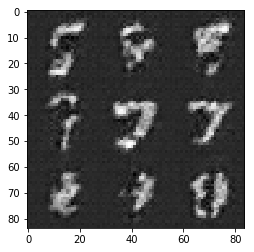

Epoch 2/2 Discriminator loss 0.3552 Generator loss 2.8104
Epoch 2/2 Discriminator loss 0.3136 Generator loss 1.8467


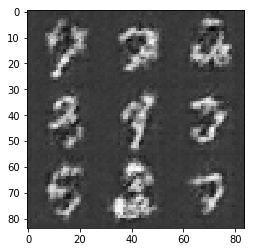

Epoch 2/2 Discriminator loss 0.1439 Generator loss 4.0478
Epoch 2/2 Discriminator loss 0.0641 Generator loss 3.5910


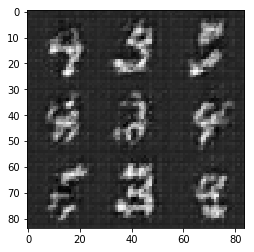

Epoch 2/2 Discriminator loss 0.0650 Generator loss 4.3121
Epoch 2/2 Discriminator loss 0.5473 Generator loss 1.0361


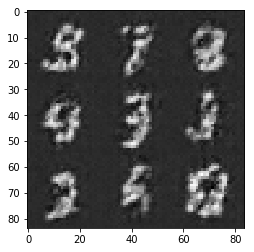

Epoch 2/2 Discriminator loss 0.2615 Generator loss 1.9326
Epoch 2/2 Discriminator loss 0.1732 Generator loss 2.6832


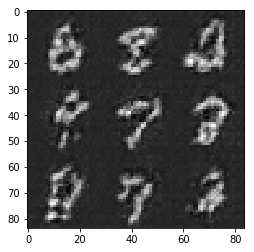

Epoch 2/2 Discriminator loss 0.2173 Generator loss 2.1433
Epoch 2/2 Discriminator loss 0.0875 Generator loss 6.4569


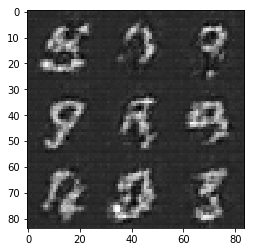

Epoch 2/2 Discriminator loss 0.0826 Generator loss 3.7827
Epoch 2/2 Discriminator loss 0.1285 Generator loss 2.9748


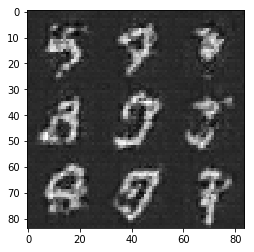

Epoch 2/2 Discriminator loss 0.0215 Generator loss 5.9645
Epoch 2/2 Discriminator loss 0.0813 Generator loss 3.7473


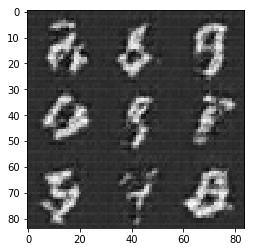

Epoch 2/2 Discriminator loss 0.1789 Generator loss 2.2509
Epoch 2/2 Discriminator loss 0.0559 Generator loss 4.7119


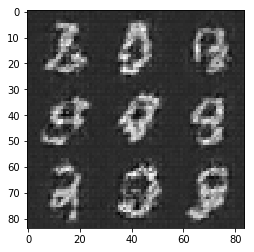

Epoch 2/2 Discriminator loss 0.1206 Generator loss 2.7895
Epoch 2/2 Discriminator loss 0.1031 Generator loss 3.6239


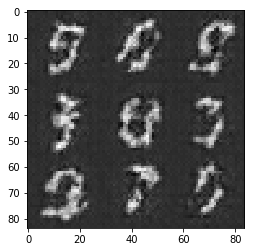

Epoch 2/2 Discriminator loss 0.1055 Generator loss 3.4419
Epoch 2/2 Discriminator loss 0.0541 Generator loss 4.6141


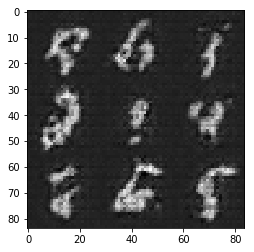

Epoch 2/2 Discriminator loss 0.3476 Generator loss 1.4507
Epoch 2/2 Discriminator loss 0.0572 Generator loss 6.2004


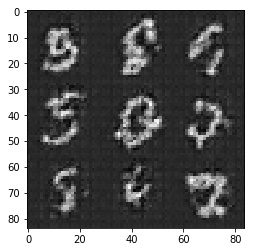

Epoch 2/2 Discriminator loss 0.0388 Generator loss 4.1439
Epoch 2/2 Discriminator loss 0.2707 Generator loss 1.7761


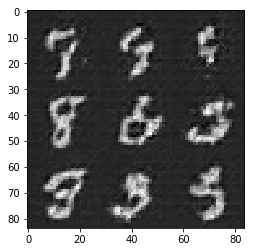

Epoch 2/2 Discriminator loss 0.2436 Generator loss 1.9180
Epoch 2/2 Discriminator loss 0.4389 Generator loss 1.2590


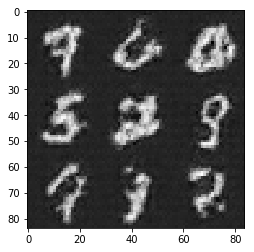

Epoch 2/2 Discriminator loss 1.0814 Generator loss 0.8091


IndexError: list index out of range

In [55]:
batch_size = 32
epochs = 2
learning_rate = 0.0002
real_size = (28,28,1) 
z_dim = 100
alpha = 0.2
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    gan = GAN(real_size=real_size, z_size=z_dim, learning_rate=learning_rate, alpha=alpha, beta1=beta1)
    train(gan,epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 Discriminator loss 3.9242 Generator loss 0.0509
Epoch 1/1 Discriminator loss 2.2249 Generator loss 0.2328


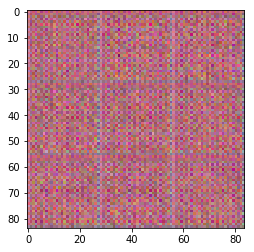

Epoch 1/1 Discriminator loss 2.2098 Generator loss 0.2489
Epoch 1/1 Discriminator loss 1.4444 Generator loss 0.5755


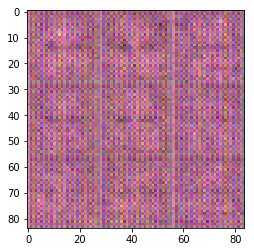

Epoch 1/1 Discriminator loss 1.0971 Generator loss 0.7412
Epoch 1/1 Discriminator loss 1.3212 Generator loss 0.9459


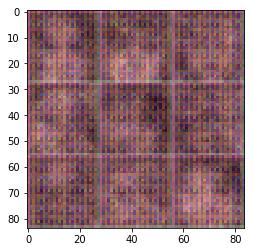

Epoch 1/1 Discriminator loss 1.1118 Generator loss 0.9646
Epoch 1/1 Discriminator loss 1.2414 Generator loss 0.7788


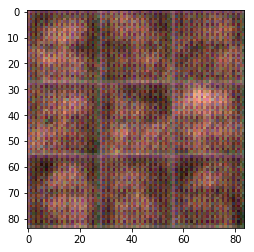

Epoch 1/1 Discriminator loss 1.3554 Generator loss 2.0047
Epoch 1/1 Discriminator loss 1.4818 Generator loss 0.6042


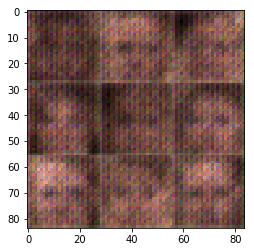

Epoch 1/1 Discriminator loss 0.9419 Generator loss 1.8301
Epoch 1/1 Discriminator loss 1.3071 Generator loss 0.5910


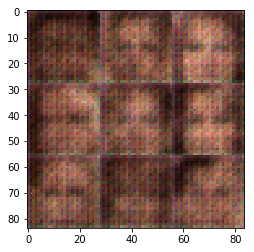

Epoch 1/1 Discriminator loss 1.1385 Generator loss 1.3673
Epoch 1/1 Discriminator loss 1.1426 Generator loss 0.9249


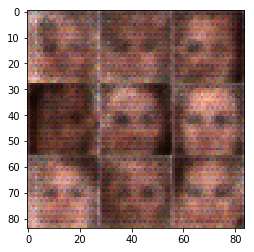

Epoch 1/1 Discriminator loss 1.8218 Generator loss 1.7448
Epoch 1/1 Discriminator loss 1.0683 Generator loss 1.1375


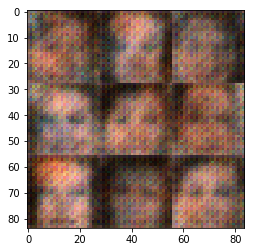

Epoch 1/1 Discriminator loss 1.6867 Generator loss 0.3954
Epoch 1/1 Discriminator loss 1.7013 Generator loss 1.0161


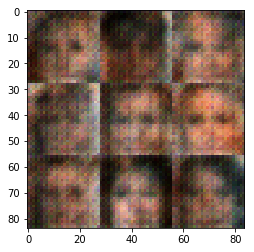

Epoch 1/1 Discriminator loss 1.3371 Generator loss 0.6267
Epoch 1/1 Discriminator loss 1.4788 Generator loss 0.4644


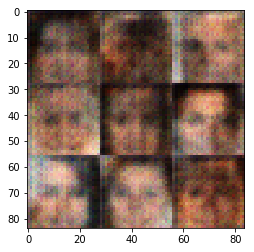

Epoch 1/1 Discriminator loss 2.0991 Generator loss 0.2585
Epoch 1/1 Discriminator loss 1.8471 Generator loss 0.2949


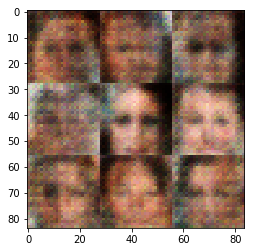

Epoch 1/1 Discriminator loss 1.1793 Generator loss 0.7996
Epoch 1/1 Discriminator loss 0.6268 Generator loss 2.1853


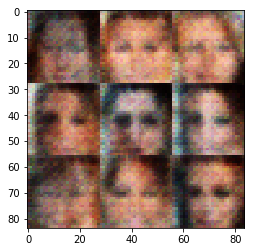

Epoch 1/1 Discriminator loss 0.8476 Generator loss 1.0919
Epoch 1/1 Discriminator loss 1.7139 Generator loss 0.3465


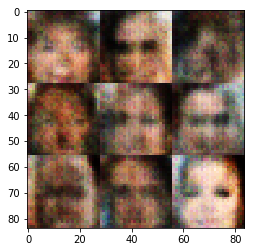

Epoch 1/1 Discriminator loss 0.7638 Generator loss 1.2002
Epoch 1/1 Discriminator loss 0.4773 Generator loss 4.5339


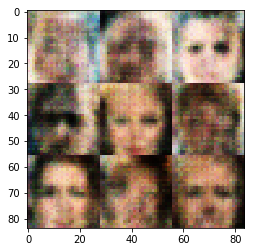

Epoch 1/1 Discriminator loss 0.4031 Generator loss 4.0523
Epoch 1/1 Discriminator loss 0.5951 Generator loss 2.1174


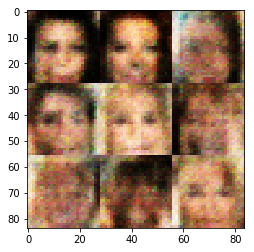

Epoch 1/1 Discriminator loss 0.5695 Generator loss 2.9423
Epoch 1/1 Discriminator loss 1.0951 Generator loss 1.8372


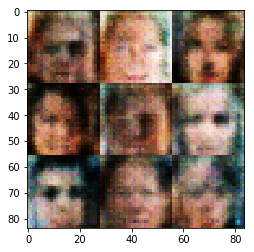

Epoch 1/1 Discriminator loss 0.4318 Generator loss 4.1179
Epoch 1/1 Discriminator loss 0.4066 Generator loss 3.5359


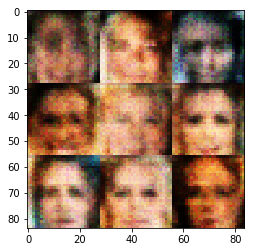

Epoch 1/1 Discriminator loss 1.2237 Generator loss 0.6087
Epoch 1/1 Discriminator loss 0.5016 Generator loss 3.7113


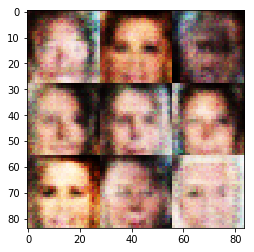

Epoch 1/1 Discriminator loss 0.7560 Generator loss 1.2174
Epoch 1/1 Discriminator loss 0.5108 Generator loss 2.7626


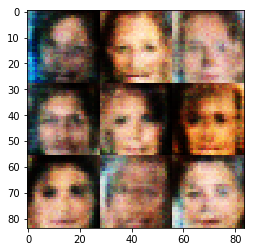

Epoch 1/1 Discriminator loss 0.7742 Generator loss 1.6058
Epoch 1/1 Discriminator loss 0.4374 Generator loss 3.7907


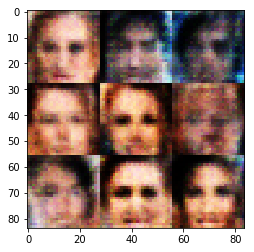

Epoch 1/1 Discriminator loss 1.2373 Generator loss 0.6118
Epoch 1/1 Discriminator loss 0.4654 Generator loss 3.0176


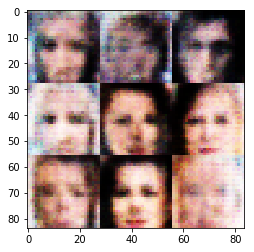

Epoch 1/1 Discriminator loss 0.6245 Generator loss 1.6985
Epoch 1/1 Discriminator loss 0.6879 Generator loss 1.9021


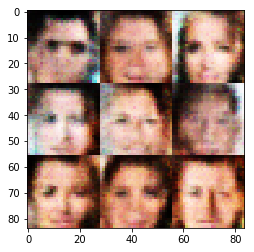

Epoch 1/1 Discriminator loss 1.4649 Generator loss 0.4871
Epoch 1/1 Discriminator loss 0.6729 Generator loss 4.0268


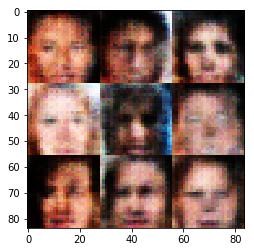

Epoch 1/1 Discriminator loss 1.5282 Generator loss 0.4764
Epoch 1/1 Discriminator loss 1.4391 Generator loss 0.5918


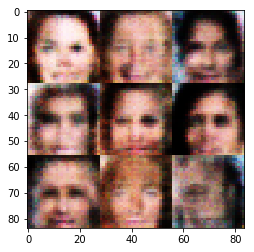

Epoch 1/1 Discriminator loss 0.9338 Generator loss 1.0358
Epoch 1/1 Discriminator loss 1.9874 Generator loss 0.2689


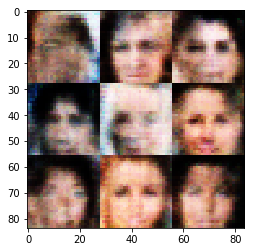

Epoch 1/1 Discriminator loss 0.7116 Generator loss 1.5823
Epoch 1/1 Discriminator loss 1.3654 Generator loss 0.5208


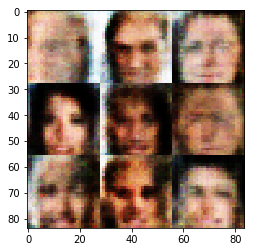

Epoch 1/1 Discriminator loss 0.4660 Generator loss 2.6968
Epoch 1/1 Discriminator loss 0.4818 Generator loss 2.4297


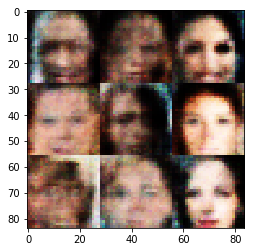

Epoch 1/1 Discriminator loss 1.3918 Generator loss 2.4001
Epoch 1/1 Discriminator loss 1.0372 Generator loss 3.0494


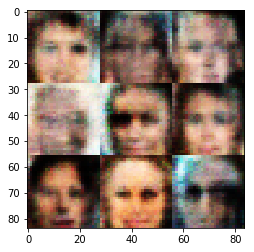

Epoch 1/1 Discriminator loss 0.5944 Generator loss 4.0257
Epoch 1/1 Discriminator loss 1.2649 Generator loss 0.6070


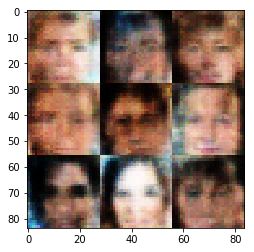

Epoch 1/1 Discriminator loss 0.7134 Generator loss 1.4306
Epoch 1/1 Discriminator loss 1.1570 Generator loss 5.9078


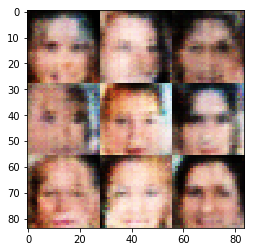

Epoch 1/1 Discriminator loss 0.8850 Generator loss 1.0755
Epoch 1/1 Discriminator loss 0.4583 Generator loss 2.8901


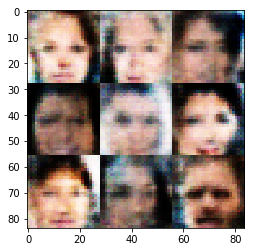

Epoch 1/1 Discriminator loss 1.9190 Generator loss 0.2723
Epoch 1/1 Discriminator loss 1.2312 Generator loss 0.6138


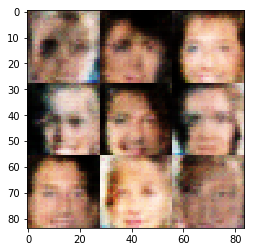

Epoch 1/1 Discriminator loss 0.4933 Generator loss 2.4259
Epoch 1/1 Discriminator loss 1.1358 Generator loss 0.7176


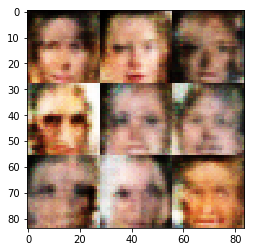

Epoch 1/1 Discriminator loss 0.7559 Generator loss 2.5289
Epoch 1/1 Discriminator loss 0.6260 Generator loss 3.1422


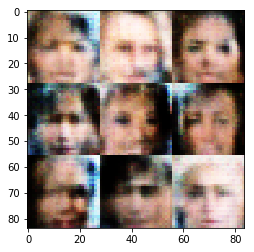

Epoch 1/1 Discriminator loss 0.5998 Generator loss 2.2982
Epoch 1/1 Discriminator loss 0.9306 Generator loss 1.0126


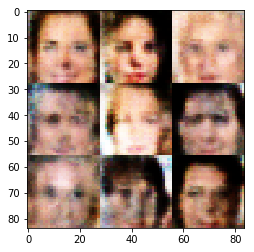

Epoch 1/1 Discriminator loss 1.3935 Generator loss 0.7272
Epoch 1/1 Discriminator loss 0.9674 Generator loss 1.3156


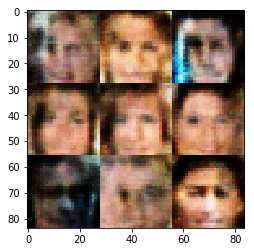

Epoch 1/1 Discriminator loss 0.5453 Generator loss 2.3488
Epoch 1/1 Discriminator loss 0.8954 Generator loss 1.0158


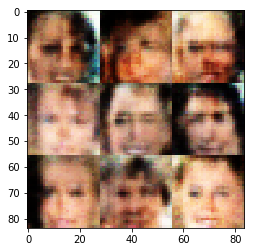

Epoch 1/1 Discriminator loss 1.2068 Generator loss 3.1285
Epoch 1/1 Discriminator loss 0.7022 Generator loss 1.3744


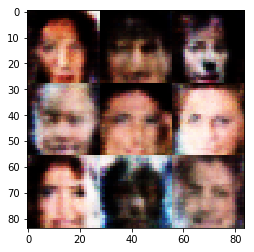

Epoch 1/1 Discriminator loss 0.6922 Generator loss 1.4021
Epoch 1/1 Discriminator loss 0.6720 Generator loss 2.4668


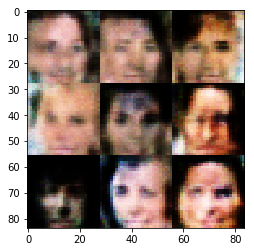

Epoch 1/1 Discriminator loss 0.7502 Generator loss 1.4021
Epoch 1/1 Discriminator loss 0.6723 Generator loss 1.9066


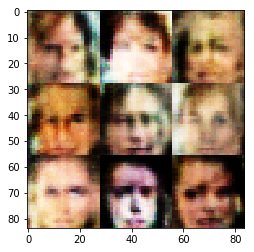

Epoch 1/1 Discriminator loss 2.1334 Generator loss 2.1821
Epoch 1/1 Discriminator loss 0.8474 Generator loss 1.1408


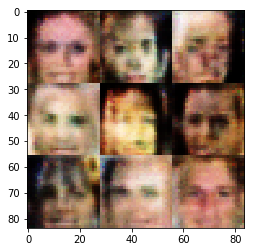

Epoch 1/1 Discriminator loss 0.6632 Generator loss 1.8246
Epoch 1/1 Discriminator loss 0.5226 Generator loss 2.3467


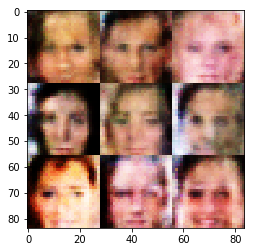

Epoch 1/1 Discriminator loss 0.9571 Generator loss 1.4922
Epoch 1/1 Discriminator loss 0.8285 Generator loss 1.2881


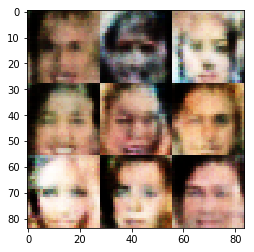

Epoch 1/1 Discriminator loss 0.7967 Generator loss 1.3465
Epoch 1/1 Discriminator loss 1.1610 Generator loss 0.7934


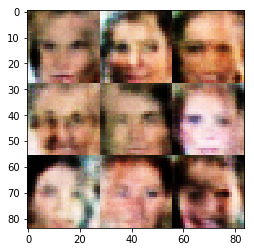

Epoch 1/1 Discriminator loss 0.5705 Generator loss 2.7930
Epoch 1/1 Discriminator loss 0.9459 Generator loss 0.9231


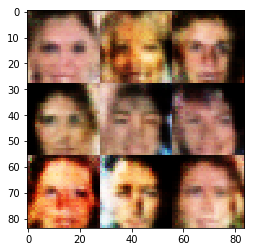

Epoch 1/1 Discriminator loss 2.4805 Generator loss 1.7867
Epoch 1/1 Discriminator loss 1.5638 Generator loss 1.9104


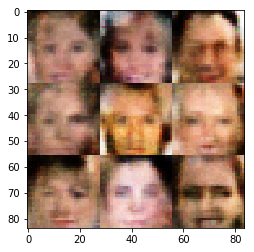

Epoch 1/1 Discriminator loss 1.4232 Generator loss 2.2155
Epoch 1/1 Discriminator loss 1.8283 Generator loss 1.3466


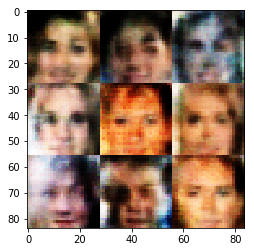

Epoch 1/1 Discriminator loss 1.0120 Generator loss 0.9258
Epoch 1/1 Discriminator loss 0.9454 Generator loss 1.1941


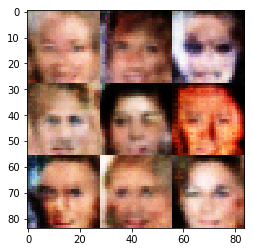

Epoch 1/1 Discriminator loss 1.1867 Generator loss 2.1716
Epoch 1/1 Discriminator loss 0.8096 Generator loss 1.2264


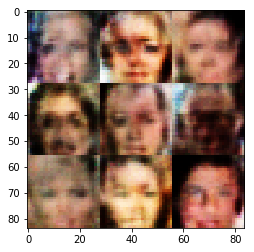

Epoch 1/1 Discriminator loss 1.2748 Generator loss 0.6107
Epoch 1/1 Discriminator loss 0.9915 Generator loss 0.8395


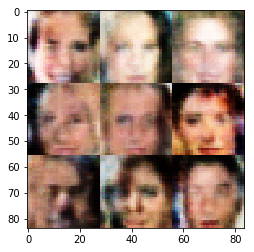

Epoch 1/1 Discriminator loss 0.8937 Generator loss 1.2402
Epoch 1/1 Discriminator loss 1.2916 Generator loss 0.5923


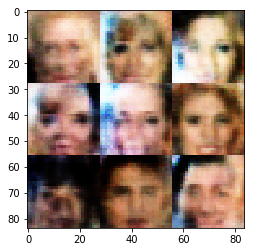

Epoch 1/1 Discriminator loss 1.1662 Generator loss 0.8372
Epoch 1/1 Discriminator loss 1.0498 Generator loss 0.8528


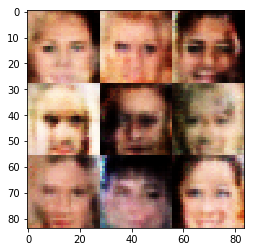

Epoch 1/1 Discriminator loss 1.3587 Generator loss 0.8514
Epoch 1/1 Discriminator loss 1.2637 Generator loss 0.6969


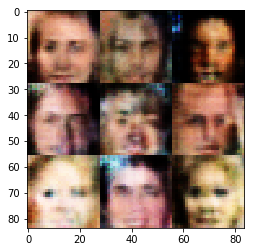

Epoch 1/1 Discriminator loss 0.8532 Generator loss 1.6473
Epoch 1/1 Discriminator loss 0.5669 Generator loss 2.2870


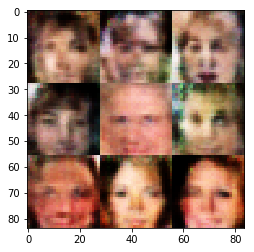

Epoch 1/1 Discriminator loss 0.5529 Generator loss 1.8706
Epoch 1/1 Discriminator loss 0.9321 Generator loss 1.2579


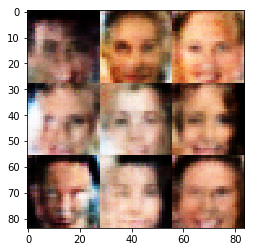

Epoch 1/1 Discriminator loss 0.9833 Generator loss 1.4439
Epoch 1/1 Discriminator loss 1.3830 Generator loss 0.7319


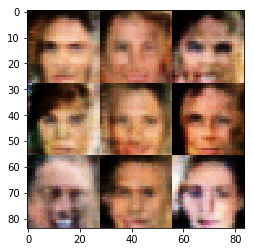

Epoch 1/1 Discriminator loss 1.1486 Generator loss 0.7538
Epoch 1/1 Discriminator loss 1.1051 Generator loss 2.0929


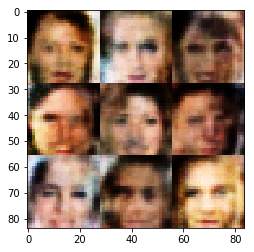

Epoch 1/1 Discriminator loss 1.0313 Generator loss 1.3271
Epoch 1/1 Discriminator loss 1.2900 Generator loss 0.5638


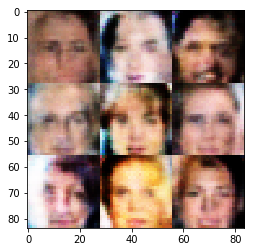

Epoch 1/1 Discriminator loss 0.9100 Generator loss 1.2308
Epoch 1/1 Discriminator loss 0.8492 Generator loss 1.7766


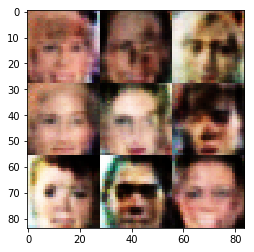

Epoch 1/1 Discriminator loss 1.4904 Generator loss 3.3995
Epoch 1/1 Discriminator loss 0.6854 Generator loss 1.6282


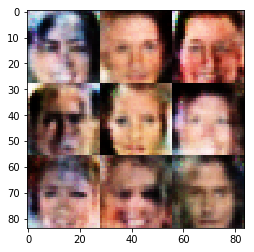

Epoch 1/1 Discriminator loss 0.6477 Generator loss 1.8206
Epoch 1/1 Discriminator loss 0.6527 Generator loss 2.1343


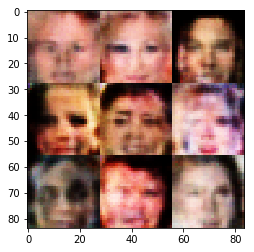

Epoch 1/1 Discriminator loss 0.9581 Generator loss 3.5947
Epoch 1/1 Discriminator loss 0.9973 Generator loss 1.0428


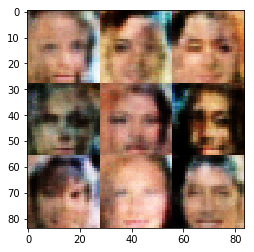

Epoch 1/1 Discriminator loss 0.6140 Generator loss 1.9008
Epoch 1/1 Discriminator loss 0.8831 Generator loss 1.3711


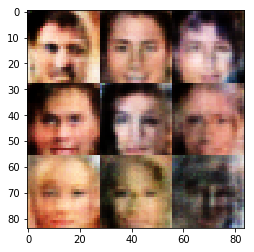

Epoch 1/1 Discriminator loss 1.6944 Generator loss 1.8062
Epoch 1/1 Discriminator loss 1.1911 Generator loss 0.7368


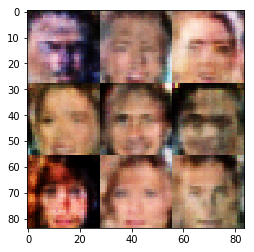

Epoch 1/1 Discriminator loss 1.0267 Generator loss 1.4608
Epoch 1/1 Discriminator loss 0.8636 Generator loss 1.2642


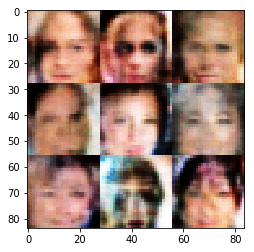

Epoch 1/1 Discriminator loss 0.4984 Generator loss 2.8976
Epoch 1/1 Discriminator loss 0.7188 Generator loss 1.4888


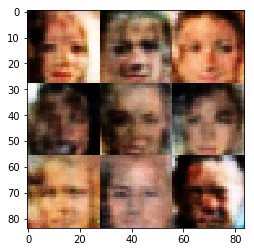

Epoch 1/1 Discriminator loss 2.6321 Generator loss 0.1293
Epoch 1/1 Discriminator loss 0.8839 Generator loss 1.8099


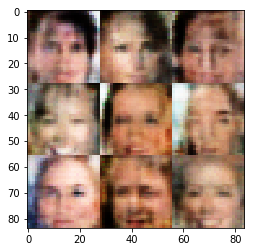

Epoch 1/1 Discriminator loss 1.1332 Generator loss 0.7730
Epoch 1/1 Discriminator loss 0.8466 Generator loss 1.3017


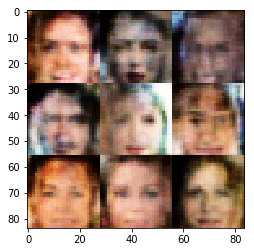

Epoch 1/1 Discriminator loss 0.4964 Generator loss 2.9401
Epoch 1/1 Discriminator loss 0.4342 Generator loss 3.4088


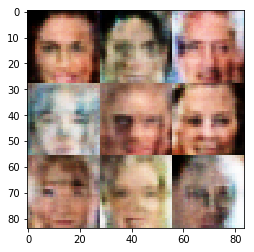

Epoch 1/1 Discriminator loss 1.1279 Generator loss 0.7694
Epoch 1/1 Discriminator loss 0.7585 Generator loss 3.0430


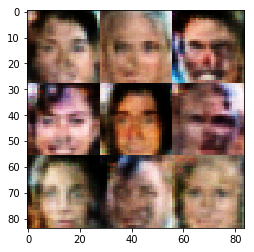

Epoch 1/1 Discriminator loss 0.9252 Generator loss 2.0580
Epoch 1/1 Discriminator loss 0.5270 Generator loss 2.0823


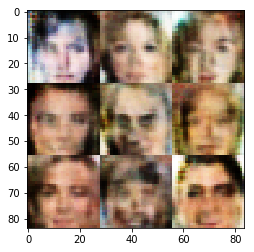

Epoch 1/1 Discriminator loss 0.6200 Generator loss 1.7464
Epoch 1/1 Discriminator loss 0.6192 Generator loss 2.0589


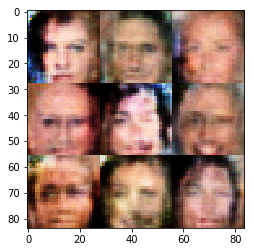

Epoch 1/1 Discriminator loss 0.7460 Generator loss 1.4382
Epoch 1/1 Discriminator loss 1.3129 Generator loss 0.7370


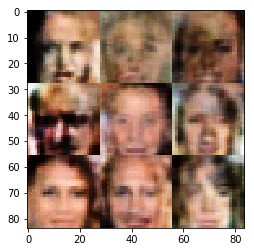

Epoch 1/1 Discriminator loss 0.4845 Generator loss 2.7797
Epoch 1/1 Discriminator loss 1.2094 Generator loss 0.6506


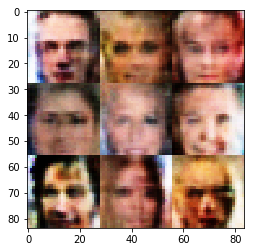

Epoch 1/1 Discriminator loss 0.7040 Generator loss 1.7215
Epoch 1/1 Discriminator loss 0.6215 Generator loss 2.4588


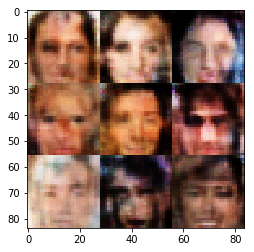

Epoch 1/1 Discriminator loss 0.7903 Generator loss 1.6523
Epoch 1/1 Discriminator loss 0.6012 Generator loss 2.8065


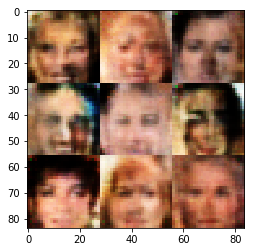

Epoch 1/1 Discriminator loss 1.6955 Generator loss 0.3943
Epoch 1/1 Discriminator loss 0.8500 Generator loss 1.5904


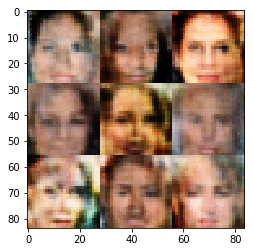

Epoch 1/1 Discriminator loss 1.0409 Generator loss 1.0230
Epoch 1/1 Discriminator loss 0.6060 Generator loss 3.0831


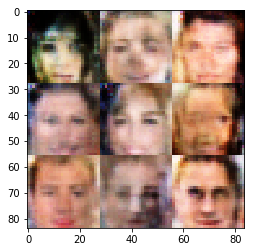

Epoch 1/1 Discriminator loss 0.3984 Generator loss 4.5517
Epoch 1/1 Discriminator loss 0.8152 Generator loss 2.0420


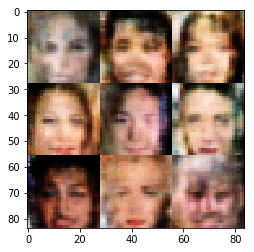

Epoch 1/1 Discriminator loss 1.7765 Generator loss 1.8938
Epoch 1/1 Discriminator loss 0.9307 Generator loss 1.0224


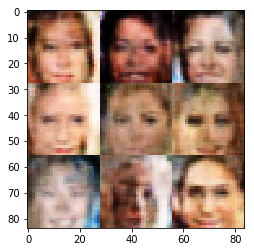

Epoch 1/1 Discriminator loss 0.7854 Generator loss 1.3636
Epoch 1/1 Discriminator loss 0.5379 Generator loss 3.4845


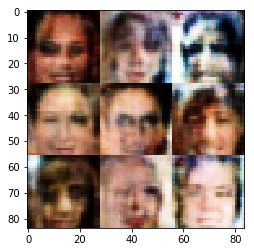

Epoch 1/1 Discriminator loss 0.7885 Generator loss 2.0928
Epoch 1/1 Discriminator loss 0.7280 Generator loss 1.8301


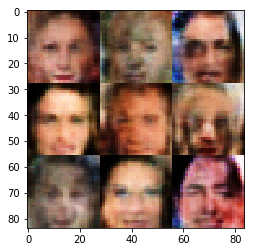

Epoch 1/1 Discriminator loss 0.5200 Generator loss 7.0719
Epoch 1/1 Discriminator loss 0.8177 Generator loss 1.4141


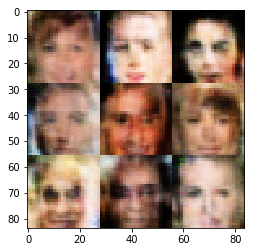

Epoch 1/1 Discriminator loss 0.9078 Generator loss 1.3305
Epoch 1/1 Discriminator loss 0.5317 Generator loss 3.4241


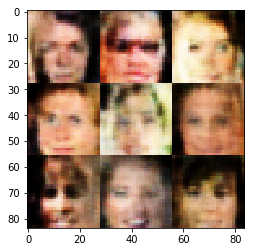

Epoch 1/1 Discriminator loss 0.9186 Generator loss 1.7224
Epoch 1/1 Discriminator loss 1.0146 Generator loss 1.2492


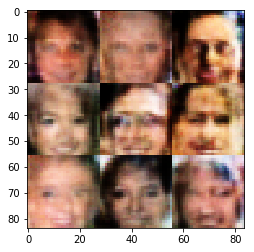

Epoch 1/1 Discriminator loss 0.8324 Generator loss 1.2707
Epoch 1/1 Discriminator loss 1.0717 Generator loss 0.7904


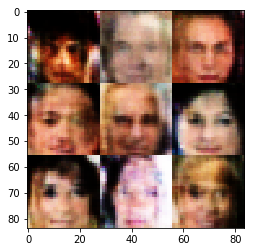

Epoch 1/1 Discriminator loss 0.6757 Generator loss 1.6727
Epoch 1/1 Discriminator loss 0.7830 Generator loss 1.3775


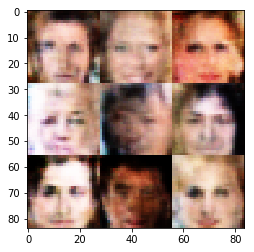

Epoch 1/1 Discriminator loss 1.2829 Generator loss 0.8106
Epoch 1/1 Discriminator loss 1.1012 Generator loss 1.0012


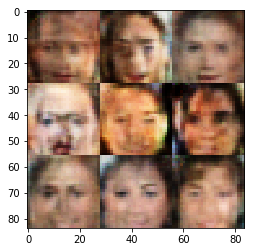

Epoch 1/1 Discriminator loss 0.9539 Generator loss 1.3585
Epoch 1/1 Discriminator loss 1.4605 Generator loss 0.4826


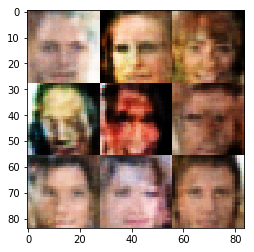

Epoch 1/1 Discriminator loss 0.7180 Generator loss 1.6229
Epoch 1/1 Discriminator loss 0.6452 Generator loss 2.0538


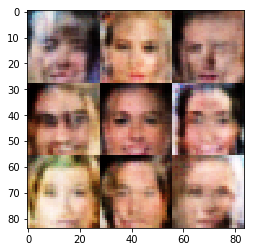

Epoch 1/1 Discriminator loss 1.1993 Generator loss 0.7207
Epoch 1/1 Discriminator loss 0.8556 Generator loss 1.3284


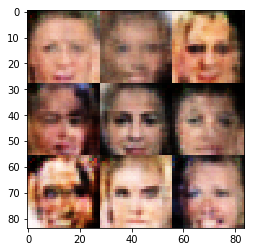

Epoch 1/1 Discriminator loss 0.8838 Generator loss 1.3136
Epoch 1/1 Discriminator loss 0.4410 Generator loss 5.3972


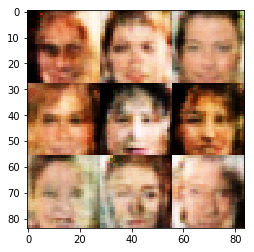

Epoch 1/1 Discriminator loss 0.9704 Generator loss 1.1201
Epoch 1/1 Discriminator loss 1.0435 Generator loss 2.7428


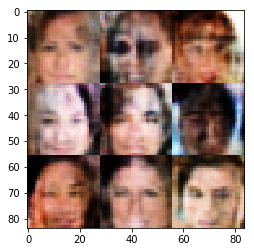

Epoch 1/1 Discriminator loss 0.8527 Generator loss 1.2245
Epoch 1/1 Discriminator loss 0.9150 Generator loss 1.4401


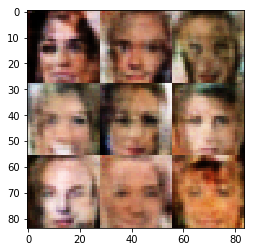

Epoch 1/1 Discriminator loss 0.6779 Generator loss 1.9244
Epoch 1/1 Discriminator loss 0.8959 Generator loss 1.4521


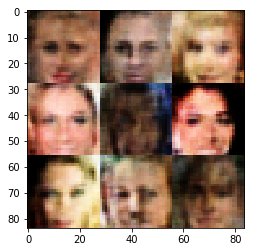

Epoch 1/1 Discriminator loss 0.5503 Generator loss 3.5175
Epoch 1/1 Discriminator loss 0.7244 Generator loss 1.5706


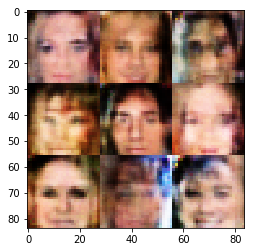

Epoch 1/1 Discriminator loss 0.3514 Generator loss 6.1732
Epoch 1/1 Discriminator loss 0.8179 Generator loss 1.4945


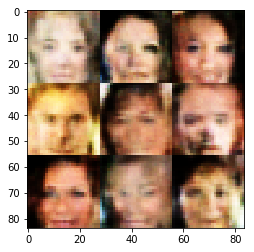

Epoch 1/1 Discriminator loss 1.3507 Generator loss 0.5944
Epoch 1/1 Discriminator loss 1.1078 Generator loss 0.7880


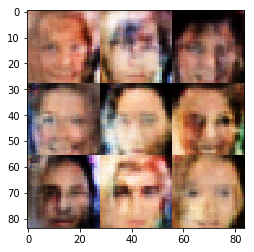

Epoch 1/1 Discriminator loss 0.9450 Generator loss 1.5617
Epoch 1/1 Discriminator loss 2.1260 Generator loss 3.8434


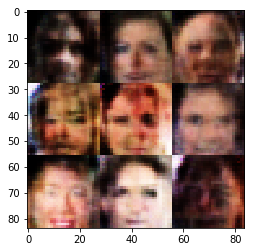

Epoch 1/1 Discriminator loss 1.2546 Generator loss 0.6380
Epoch 1/1 Discriminator loss 0.7843 Generator loss 1.4154


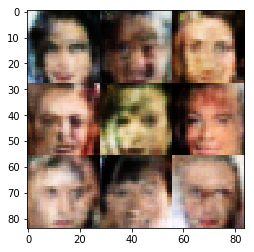

Epoch 1/1 Discriminator loss 1.1933 Generator loss 0.6810
Epoch 1/1 Discriminator loss 1.2169 Generator loss 0.8898


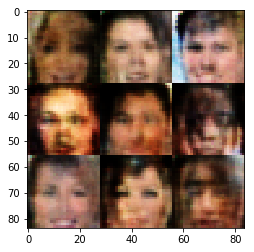

Epoch 1/1 Discriminator loss 0.6263 Generator loss 2.4874
Epoch 1/1 Discriminator loss 1.1743 Generator loss 1.5583


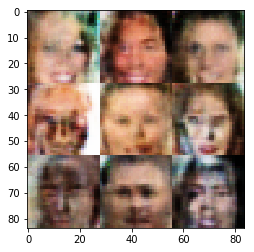

Epoch 1/1 Discriminator loss 1.3112 Generator loss 0.7443
Epoch 1/1 Discriminator loss 0.9856 Generator loss 1.2949


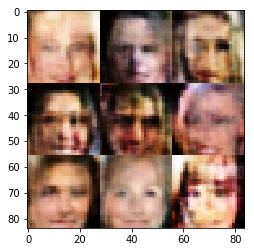

Epoch 1/1 Discriminator loss 0.6990 Generator loss 1.5917
Epoch 1/1 Discriminator loss 1.0432 Generator loss 1.2130


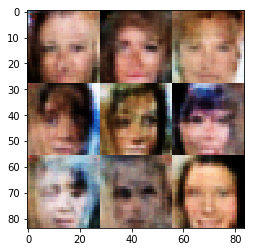

Epoch 1/1 Discriminator loss 1.3749 Generator loss 0.5289
Epoch 1/1 Discriminator loss 0.9156 Generator loss 1.1801


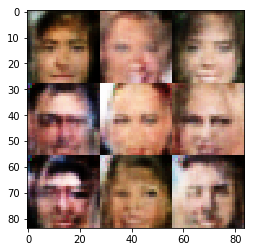

Epoch 1/1 Discriminator loss 0.7668 Generator loss 1.5093
Epoch 1/1 Discriminator loss 0.5584 Generator loss 2.3668


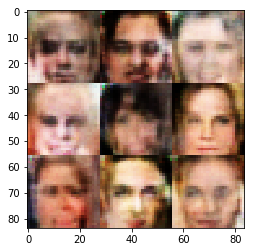

Epoch 1/1 Discriminator loss 0.7777 Generator loss 1.3972
Epoch 1/1 Discriminator loss 0.5461 Generator loss 2.7479


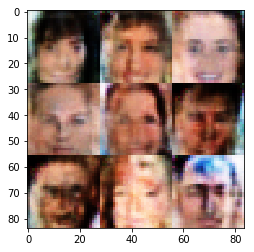

Epoch 1/1 Discriminator loss 0.7868 Generator loss 1.5523
Epoch 1/1 Discriminator loss 1.8183 Generator loss 0.2981


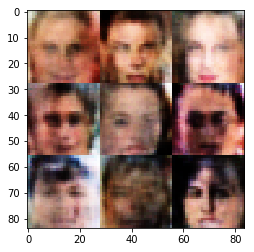

Epoch 1/1 Discriminator loss 0.9019 Generator loss 1.3257
Epoch 1/1 Discriminator loss 0.5156 Generator loss 2.2679


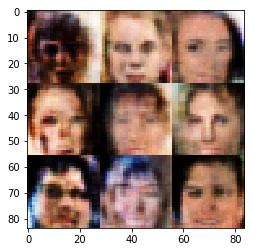

Epoch 1/1 Discriminator loss 1.4535 Generator loss 0.4770
Epoch 1/1 Discriminator loss 0.5069 Generator loss 2.8213


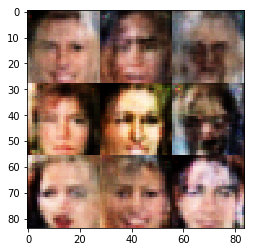

Epoch 1/1 Discriminator loss 0.5872 Generator loss 3.5952
Epoch 1/1 Discriminator loss 1.0392 Generator loss 1.4967


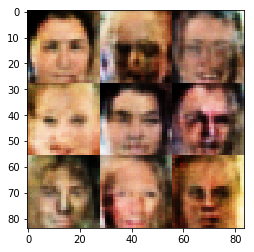

Epoch 1/1 Discriminator loss 0.4344 Generator loss 4.0412
Epoch 1/1 Discriminator loss 0.7198 Generator loss 1.6438


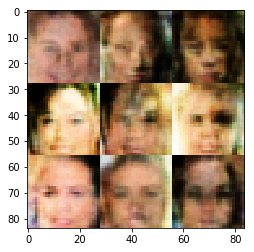

Epoch 1/1 Discriminator loss 0.7471 Generator loss 1.6313
Epoch 1/1 Discriminator loss 0.9159 Generator loss 1.0251


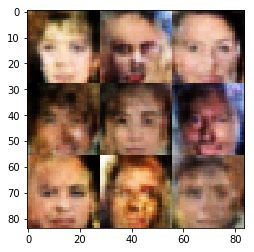

Epoch 1/1 Discriminator loss 0.9524 Generator loss 1.5892
Epoch 1/1 Discriminator loss 0.8724 Generator loss 1.7628


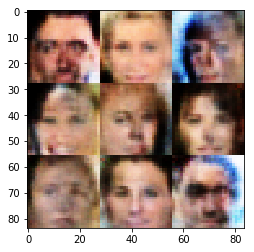

Epoch 1/1 Discriminator loss 0.6839 Generator loss 2.0768
Epoch 1/1 Discriminator loss 0.8151 Generator loss 1.3559


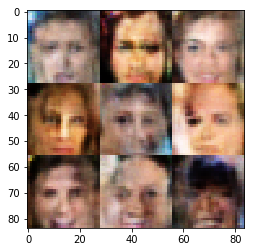

Epoch 1/1 Discriminator loss 0.5787 Generator loss 4.2913
Epoch 1/1 Discriminator loss 0.6724 Generator loss 1.8680


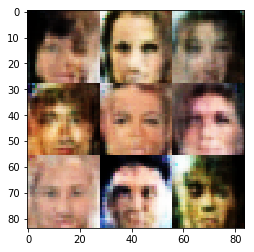

Epoch 1/1 Discriminator loss 1.8408 Generator loss 0.4203
Epoch 1/1 Discriminator loss 0.8783 Generator loss 1.4597


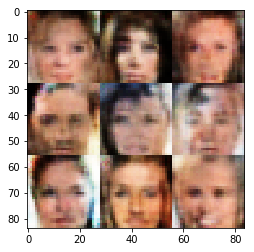

Epoch 1/1 Discriminator loss 0.7577 Generator loss 1.5308
Epoch 1/1 Discriminator loss 1.0017 Generator loss 0.9697


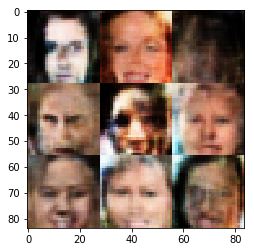

Epoch 1/1 Discriminator loss 0.9194 Generator loss 2.1520
Epoch 1/1 Discriminator loss 1.1209 Generator loss 2.4029


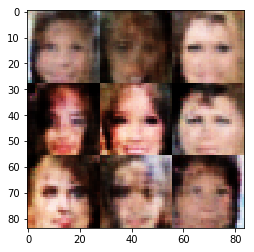

Epoch 1/1 Discriminator loss 0.8218 Generator loss 1.2698
Epoch 1/1 Discriminator loss 0.5228 Generator loss 3.0593


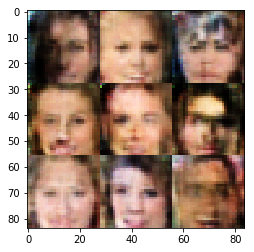

Epoch 1/1 Discriminator loss 1.1522 Generator loss 0.7219
Epoch 1/1 Discriminator loss 0.5107 Generator loss 3.0909


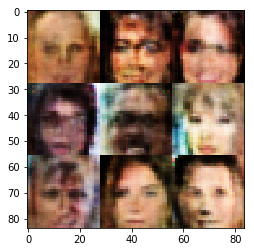

Epoch 1/1 Discriminator loss 1.4184 Generator loss 0.5359
Epoch 1/1 Discriminator loss 0.6663 Generator loss 3.0172


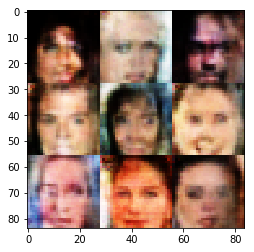

Epoch 1/1 Discriminator loss 1.4563 Generator loss 0.4773
Epoch 1/1 Discriminator loss 1.1374 Generator loss 0.8611


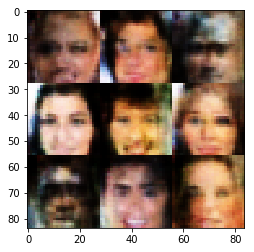

Epoch 1/1 Discriminator loss 1.9165 Generator loss 0.2758
Epoch 1/1 Discriminator loss 1.0262 Generator loss 0.9222


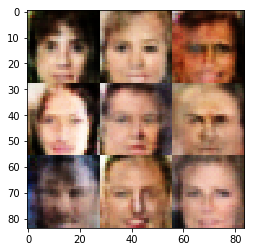

Epoch 1/1 Discriminator loss 0.8203 Generator loss 1.2708
Epoch 1/1 Discriminator loss 1.9523 Generator loss 0.2522


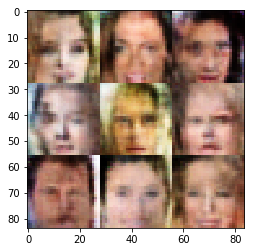

Epoch 1/1 Discriminator loss 0.7638 Generator loss 1.5404
Epoch 1/1 Discriminator loss 0.7051 Generator loss 2.6644


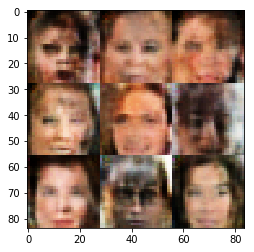

Epoch 1/1 Discriminator loss 0.7752 Generator loss 1.6511
Epoch 1/1 Discriminator loss 0.7506 Generator loss 1.4033


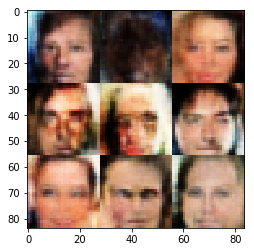

Epoch 1/1 Discriminator loss 0.8594 Generator loss 1.3309
Epoch 1/1 Discriminator loss 0.7636 Generator loss 2.0463


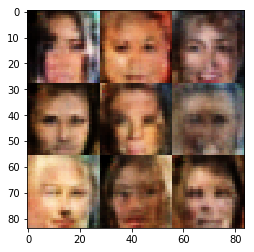

Epoch 1/1 Discriminator loss 0.7535 Generator loss 1.5187
Epoch 1/1 Discriminator loss 0.4051 Generator loss 5.3482


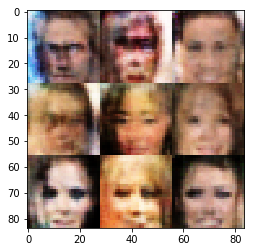

Epoch 1/1 Discriminator loss 1.2651 Generator loss 0.6651
Epoch 1/1 Discriminator loss 0.7286 Generator loss 1.7492


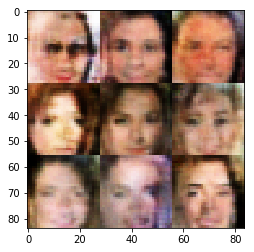

Epoch 1/1 Discriminator loss 0.8851 Generator loss 1.3412
Epoch 1/1 Discriminator loss 1.6850 Generator loss 0.3966


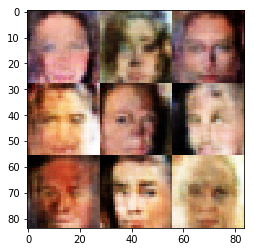

Epoch 1/1 Discriminator loss 0.6124 Generator loss 2.3319
Epoch 1/1 Discriminator loss 1.1176 Generator loss 0.9056


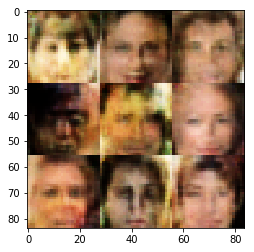

Epoch 1/1 Discriminator loss 0.9948 Generator loss 0.9666
Epoch 1/1 Discriminator loss 1.3458 Generator loss 0.5820


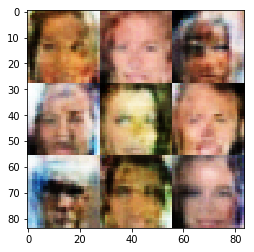

Epoch 1/1 Discriminator loss 0.9405 Generator loss 1.3229
Epoch 1/1 Discriminator loss 1.4352 Generator loss 0.6451


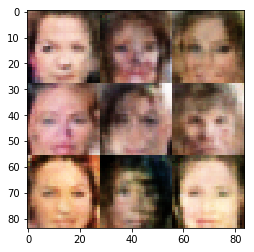

Epoch 1/1 Discriminator loss 1.2132 Generator loss 0.7136
Epoch 1/1 Discriminator loss 1.3394 Generator loss 0.7860


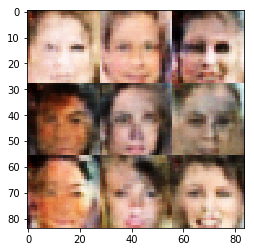

Epoch 1/1 Discriminator loss 1.2637 Generator loss 0.6500
Epoch 1/1 Discriminator loss 0.7785 Generator loss 1.2908


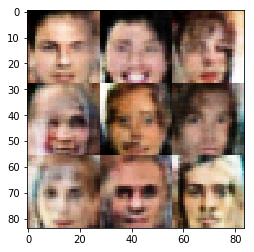

Epoch 1/1 Discriminator loss 1.3995 Generator loss 0.6532
Epoch 1/1 Discriminator loss 0.9924 Generator loss 1.0203


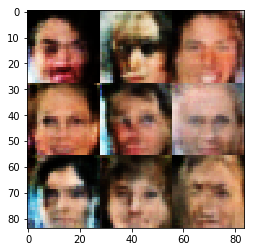

Epoch 1/1 Discriminator loss 0.5143 Generator loss 2.6677
Epoch 1/1 Discriminator loss 1.5197 Generator loss 0.4446


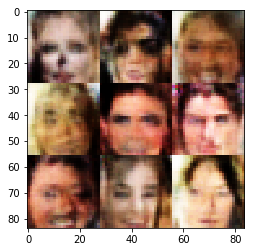

Epoch 1/1 Discriminator loss 1.1412 Generator loss 0.8162
Epoch 1/1 Discriminator loss 0.7374 Generator loss 1.5848


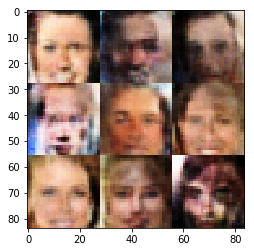

Epoch 1/1 Discriminator loss 0.5608 Generator loss 2.7056
Epoch 1/1 Discriminator loss 0.6998 Generator loss 1.8285


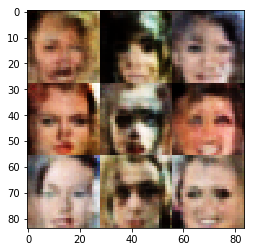

Epoch 1/1 Discriminator loss 0.9899 Generator loss 0.9617
Epoch 1/1 Discriminator loss 0.6003 Generator loss 2.0425


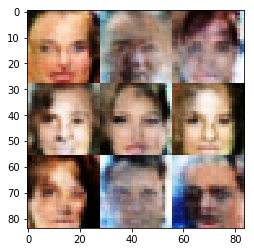

Epoch 1/1 Discriminator loss 0.7630 Generator loss 2.1769
Epoch 1/1 Discriminator loss 0.9756 Generator loss 1.5536


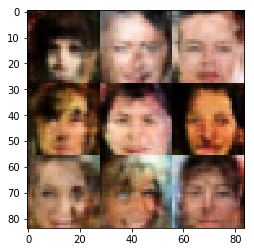

Epoch 1/1 Discriminator loss 1.3148 Generator loss 1.3378
Epoch 1/1 Discriminator loss 1.0050 Generator loss 0.8623


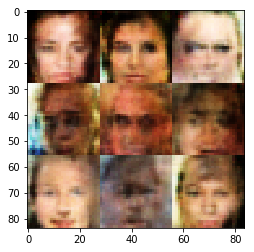

Epoch 1/1 Discriminator loss 0.7363 Generator loss 1.9097
Epoch 1/1 Discriminator loss 0.7942 Generator loss 1.6734


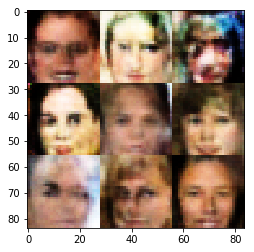

Epoch 1/1 Discriminator loss 0.5244 Generator loss 2.7421
Epoch 1/1 Discriminator loss 1.1992 Generator loss 0.7829


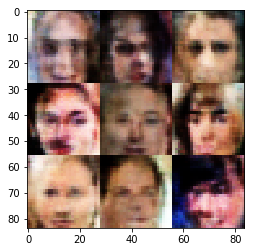

Epoch 1/1 Discriminator loss 0.7071 Generator loss 1.8319
Epoch 1/1 Discriminator loss 0.8742 Generator loss 1.1390


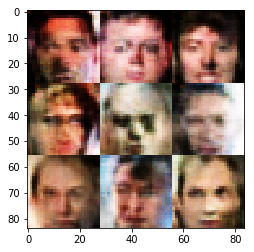

Epoch 1/1 Discriminator loss 0.9698 Generator loss 1.2821
Epoch 1/1 Discriminator loss 0.7520 Generator loss 1.8907


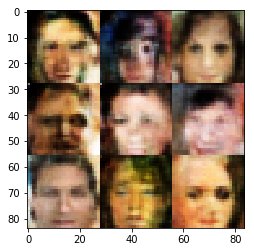

Epoch 1/1 Discriminator loss 1.1736 Generator loss 0.6915
Epoch 1/1 Discriminator loss 0.8905 Generator loss 1.6259


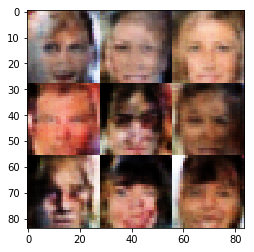

Epoch 1/1 Discriminator loss 0.6212 Generator loss 3.0731
Epoch 1/1 Discriminator loss 0.7009 Generator loss 2.5197


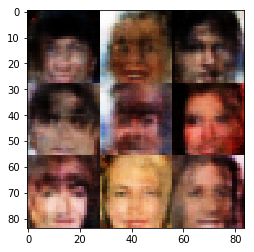

Epoch 1/1 Discriminator loss 0.9166 Generator loss 1.5625
Epoch 1/1 Discriminator loss 1.3939 Generator loss 0.5374


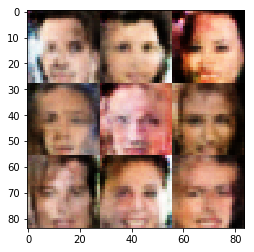

Epoch 1/1 Discriminator loss 1.1774 Generator loss 1.1166
Epoch 1/1 Discriminator loss 1.4268 Generator loss 3.3879


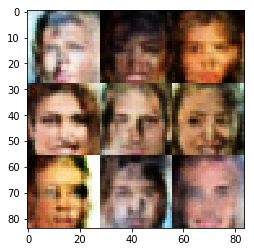

Epoch 1/1 Discriminator loss 0.8593 Generator loss 1.4311
Epoch 1/1 Discriminator loss 1.2684 Generator loss 0.8533


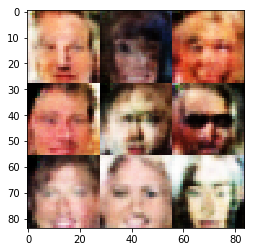

Epoch 1/1 Discriminator loss 0.9714 Generator loss 1.1107
Epoch 1/1 Discriminator loss 1.2415 Generator loss 0.6948


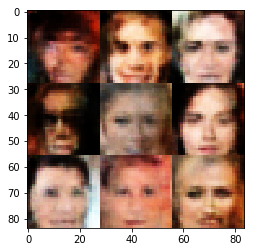

Epoch 1/1 Discriminator loss 1.1173 Generator loss 0.7529
Epoch 1/1 Discriminator loss 0.5265 Generator loss 3.1120


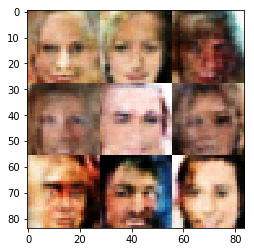

Epoch 1/1 Discriminator loss 0.9123 Generator loss 1.6301
Epoch 1/1 Discriminator loss 0.6827 Generator loss 1.8755


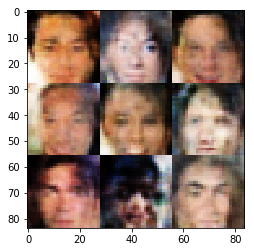

Epoch 1/1 Discriminator loss 0.7446 Generator loss 2.1587
Epoch 1/1 Discriminator loss 0.8720 Generator loss 1.3219


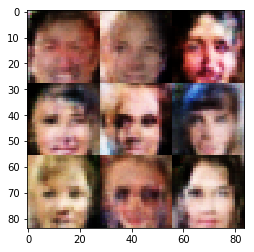

Epoch 1/1 Discriminator loss 0.4369 Generator loss 3.7051
Epoch 1/1 Discriminator loss 1.1825 Generator loss 1.1365


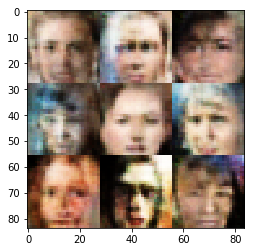

Epoch 1/1 Discriminator loss 0.5379 Generator loss 2.3643
Epoch 1/1 Discriminator loss 1.5186 Generator loss 0.5581


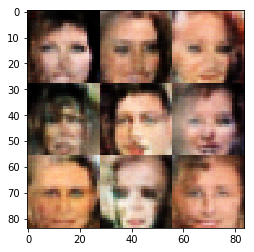

Epoch 1/1 Discriminator loss 0.7185 Generator loss 1.7828
Epoch 1/1 Discriminator loss 0.8232 Generator loss 1.3915


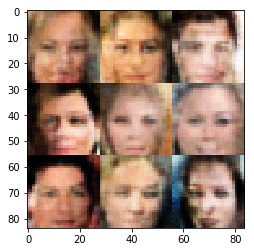

Epoch 1/1 Discriminator loss 0.6096 Generator loss 1.8697
Epoch 1/1 Discriminator loss 0.7108 Generator loss 1.6357


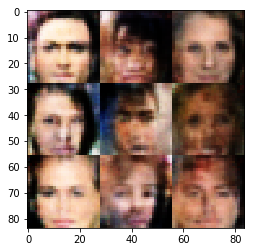

Epoch 1/1 Discriminator loss 0.8433 Generator loss 1.2454
Epoch 1/1 Discriminator loss 1.1110 Generator loss 0.8184


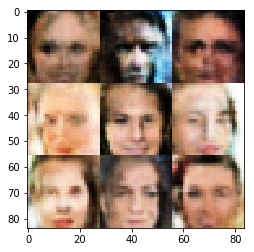

Epoch 1/1 Discriminator loss 0.6669 Generator loss 1.9447
Epoch 1/1 Discriminator loss 0.4459 Generator loss 3.9631


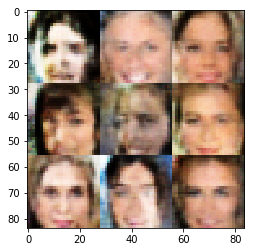

Epoch 1/1 Discriminator loss 0.8032 Generator loss 1.3173
Epoch 1/1 Discriminator loss 1.3865 Generator loss 0.6635


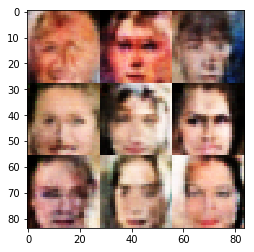

Epoch 1/1 Discriminator loss 0.7031 Generator loss 1.6085
Epoch 1/1 Discriminator loss 0.7068 Generator loss 1.8563


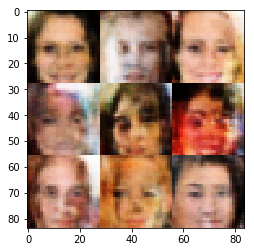

Epoch 1/1 Discriminator loss 1.1599 Generator loss 0.9537
Epoch 1/1 Discriminator loss 0.6902 Generator loss 1.7476


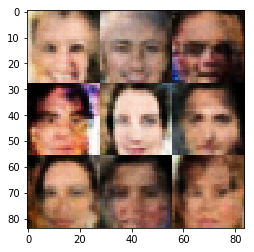

Epoch 1/1 Discriminator loss 0.5808 Generator loss 2.5749
Epoch 1/1 Discriminator loss 0.4533 Generator loss 3.8916


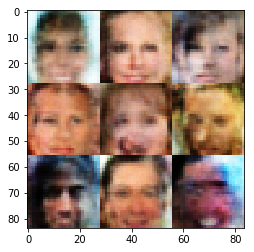

Epoch 1/1 Discriminator loss 0.8347 Generator loss 1.3381
Epoch 1/1 Discriminator loss 0.7991 Generator loss 1.9028


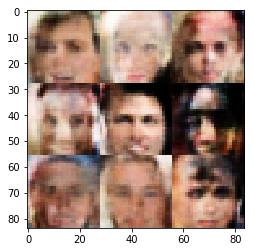

Epoch 1/1 Discriminator loss 0.8867 Generator loss 1.4400
Epoch 1/1 Discriminator loss 1.5085 Generator loss 0.4838


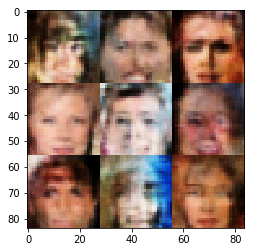

Epoch 1/1 Discriminator loss 0.7101 Generator loss 1.7562
Epoch 1/1 Discriminator loss 0.9550 Generator loss 1.0198


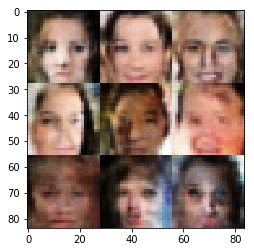

Epoch 1/1 Discriminator loss 1.8235 Generator loss 0.3114
Epoch 1/1 Discriminator loss 0.5230 Generator loss 3.1079


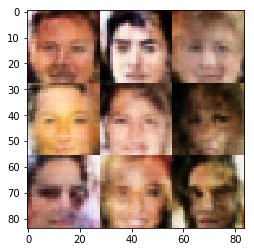

Epoch 1/1 Discriminator loss 0.8352 Generator loss 1.2245
Epoch 1/1 Discriminator loss 0.9115 Generator loss 1.4365


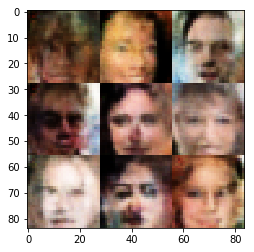

Epoch 1/1 Discriminator loss 0.8731 Generator loss 1.4203
Epoch 1/1 Discriminator loss 1.0993 Generator loss 2.1849


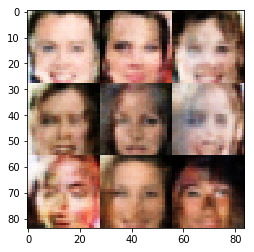

Epoch 1/1 Discriminator loss 1.2771 Generator loss 0.7167
Epoch 1/1 Discriminator loss 1.2955 Generator loss 0.7946


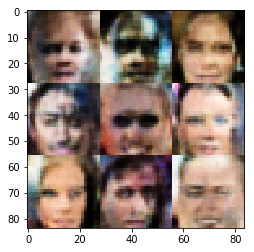

Epoch 1/1 Discriminator loss 0.9431 Generator loss 1.0964
Epoch 1/1 Discriminator loss 0.9435 Generator loss 1.1072


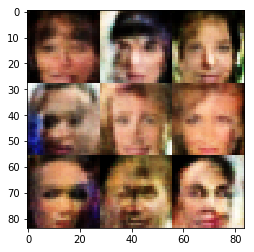

Epoch 1/1 Discriminator loss 1.3573 Generator loss 0.6012
Epoch 1/1 Discriminator loss 0.7290 Generator loss 1.5928


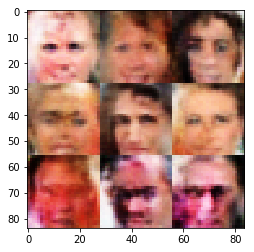

Epoch 1/1 Discriminator loss 0.5464 Generator loss 2.6336
Epoch 1/1 Discriminator loss 0.7053 Generator loss 1.8486


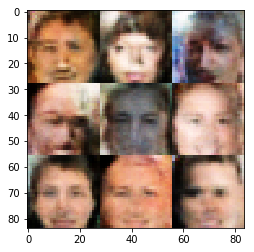

Epoch 1/1 Discriminator loss 0.4322 Generator loss 3.6574
Epoch 1/1 Discriminator loss 0.6112 Generator loss 3.1699


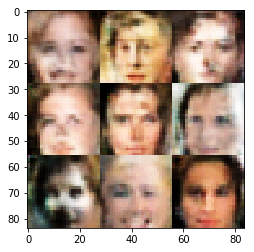

Epoch 1/1 Discriminator loss 0.9298 Generator loss 1.5661
Epoch 1/1 Discriminator loss 0.5302 Generator loss 2.5444


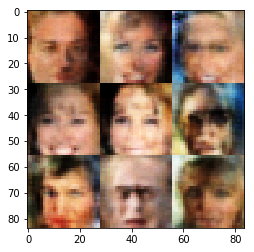

Epoch 1/1 Discriminator loss 0.6163 Generator loss 2.2672
Epoch 1/1 Discriminator loss 0.9838 Generator loss 1.5901


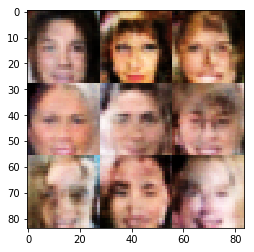

Epoch 1/1 Discriminator loss 1.7421 Generator loss 0.3819
Epoch 1/1 Discriminator loss 1.0952 Generator loss 0.8776


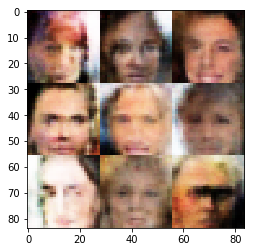

Epoch 1/1 Discriminator loss 1.0693 Generator loss 1.1457
Epoch 1/1 Discriminator loss 0.7864 Generator loss 1.9438


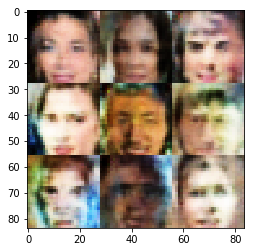

Epoch 1/1 Discriminator loss 0.7775 Generator loss 1.2798
Epoch 1/1 Discriminator loss 1.2458 Generator loss 0.6841


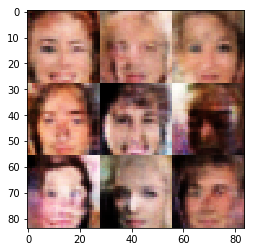

Epoch 1/1 Discriminator loss 0.6592 Generator loss 2.5563
Epoch 1/1 Discriminator loss 0.9571 Generator loss 1.1567


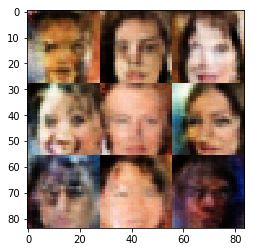

Epoch 1/1 Discriminator loss 0.7566 Generator loss 1.6775
Epoch 1/1 Discriminator loss 0.7162 Generator loss 1.4949


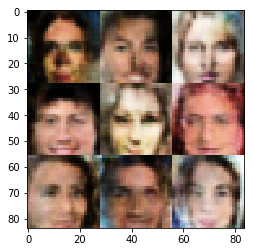

Epoch 1/1 Discriminator loss 0.8672 Generator loss 1.2602
Epoch 1/1 Discriminator loss 1.0219 Generator loss 1.0163


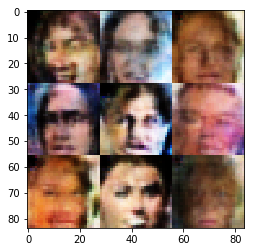

Epoch 1/1 Discriminator loss 0.8456 Generator loss 1.2317
Epoch 1/1 Discriminator loss 0.8124 Generator loss 1.2683


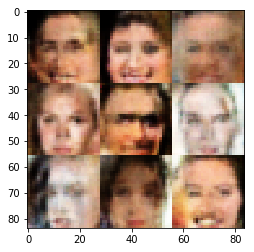

Epoch 1/1 Discriminator loss 0.9358 Generator loss 1.0256
Epoch 1/1 Discriminator loss 0.8659 Generator loss 2.0813


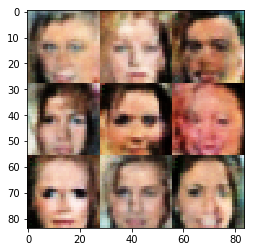

Epoch 1/1 Discriminator loss 0.8700 Generator loss 1.3007
Epoch 1/1 Discriminator loss 0.6586 Generator loss 4.7821


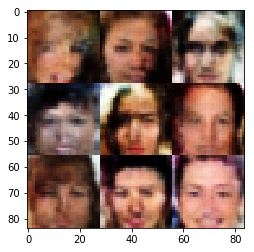

Epoch 1/1 Discriminator loss 0.6575 Generator loss 2.8065
Epoch 1/1 Discriminator loss 0.4743 Generator loss 3.9894


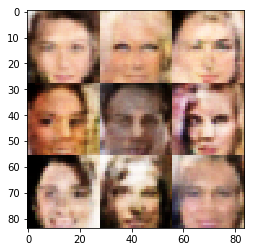

Epoch 1/1 Discriminator loss 0.6673 Generator loss 2.4448
Epoch 1/1 Discriminator loss 1.6901 Generator loss 3.1609


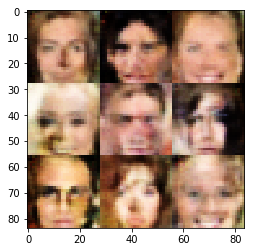

Epoch 1/1 Discriminator loss 0.8071 Generator loss 1.6386
Epoch 1/1 Discriminator loss 0.6779 Generator loss 2.1191


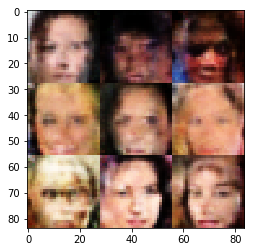

Epoch 1/1 Discriminator loss 0.7345 Generator loss 2.0878
Epoch 1/1 Discriminator loss 0.9278 Generator loss 1.1091


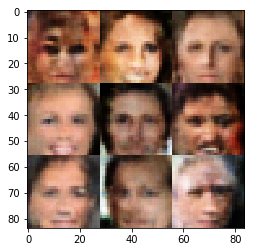

Epoch 1/1 Discriminator loss 0.5552 Generator loss 2.9035
Epoch 1/1 Discriminator loss 0.5947 Generator loss 2.1321


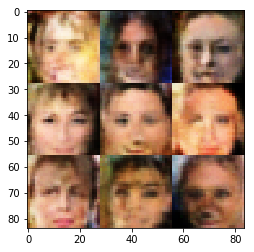

Epoch 1/1 Discriminator loss 1.0482 Generator loss 0.8817
Epoch 1/1 Discriminator loss 0.8325 Generator loss 1.1721


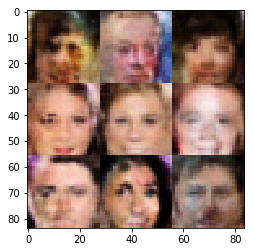

Epoch 1/1 Discriminator loss 0.6757 Generator loss 1.5306
Epoch 1/1 Discriminator loss 1.0935 Generator loss 0.9410


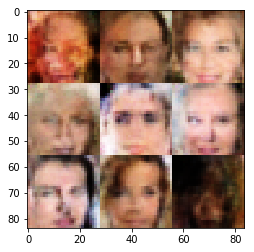

Epoch 1/1 Discriminator loss 0.7095 Generator loss 1.5531
Epoch 1/1 Discriminator loss 0.7343 Generator loss 1.8657


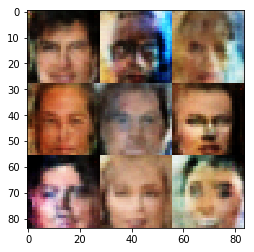

Epoch 1/1 Discriminator loss 0.5904 Generator loss 2.1777
Epoch 1/1 Discriminator loss 0.7855 Generator loss 1.7867


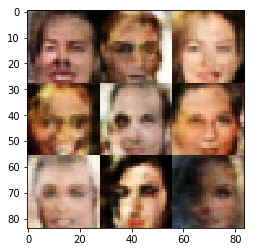

Epoch 1/1 Discriminator loss 1.0566 Generator loss 0.9389
Epoch 1/1 Discriminator loss 0.8193 Generator loss 1.8020


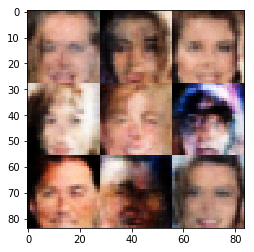

Epoch 1/1 Discriminator loss 1.2152 Generator loss 0.6849
Epoch 1/1 Discriminator loss 0.8610 Generator loss 1.5287


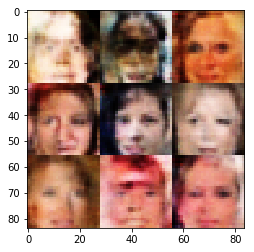

Epoch 1/1 Discriminator loss 0.7410 Generator loss 1.3506
Epoch 1/1 Discriminator loss 0.7434 Generator loss 2.1131


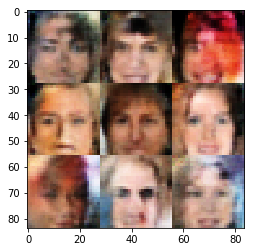

Epoch 1/1 Discriminator loss 0.7874 Generator loss 1.3436
Epoch 1/1 Discriminator loss 0.7256 Generator loss 2.2251


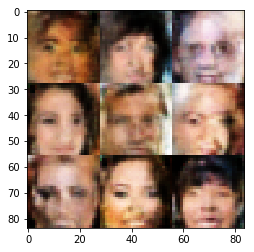

Epoch 1/1 Discriminator loss 1.0807 Generator loss 3.9046
Epoch 1/1 Discriminator loss 0.5790 Generator loss 2.6747


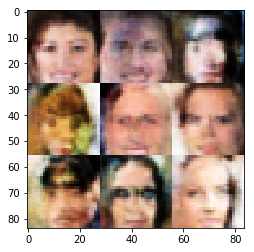

Epoch 1/1 Discriminator loss 0.5775 Generator loss 2.3750
Epoch 1/1 Discriminator loss 0.6343 Generator loss 2.2281


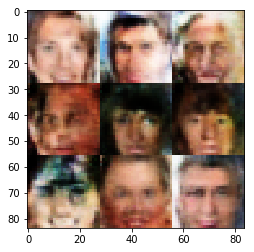

Epoch 1/1 Discriminator loss 0.8817 Generator loss 1.7863
Epoch 1/1 Discriminator loss 1.8826 Generator loss 0.3876


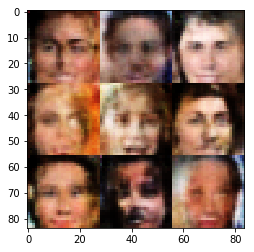

Epoch 1/1 Discriminator loss 1.1112 Generator loss 2.3730
Epoch 1/1 Discriminator loss 1.2237 Generator loss 0.8701


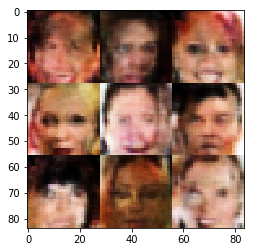

Epoch 1/1 Discriminator loss 0.7520 Generator loss 1.5634
Epoch 1/1 Discriminator loss 0.9289 Generator loss 1.0543


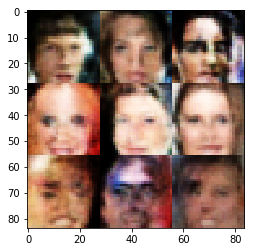

Epoch 1/1 Discriminator loss 0.8430 Generator loss 1.4808
Epoch 1/1 Discriminator loss 0.7489 Generator loss 1.8742


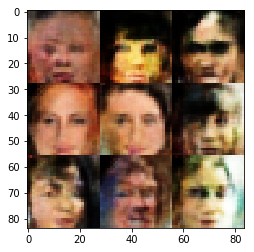

Epoch 1/1 Discriminator loss 0.9354 Generator loss 1.2221
Epoch 1/1 Discriminator loss 0.4372 Generator loss 5.1682


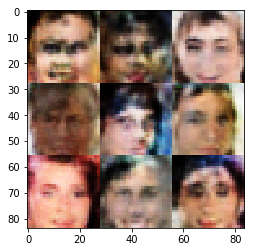

Epoch 1/1 Discriminator loss 0.9489 Generator loss 1.4223
Epoch 1/1 Discriminator loss 0.8441 Generator loss 1.3937


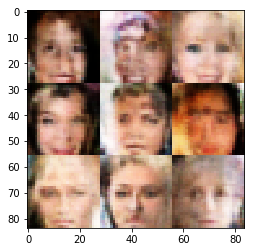

Epoch 1/1 Discriminator loss 0.4423 Generator loss 3.2080
Epoch 1/1 Discriminator loss 0.7519 Generator loss 1.9651


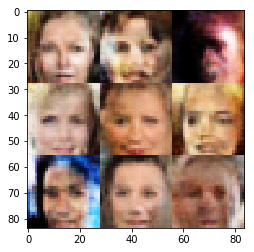

Epoch 1/1 Discriminator loss 0.5024 Generator loss 4.6431
Epoch 1/1 Discriminator loss 0.8016 Generator loss 1.1014


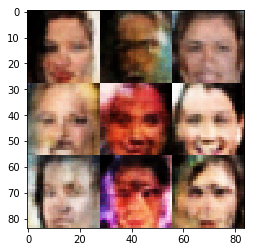

Epoch 1/1 Discriminator loss 0.6703 Generator loss 2.3051
Epoch 1/1 Discriminator loss 0.8434 Generator loss 1.1410


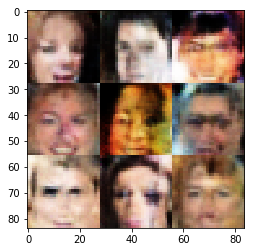

Epoch 1/1 Discriminator loss 0.8389 Generator loss 1.5320
Epoch 1/1 Discriminator loss 1.1308 Generator loss 0.8294


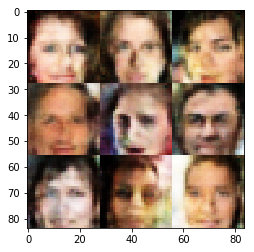

Epoch 1/1 Discriminator loss 0.9071 Generator loss 1.4974
Epoch 1/1 Discriminator loss 0.9952 Generator loss 1.2402


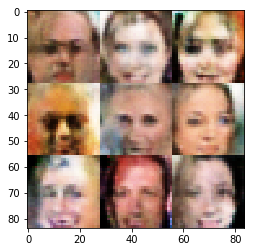

Epoch 1/1 Discriminator loss 0.7552 Generator loss 2.7068
Epoch 1/1 Discriminator loss 0.4209 Generator loss 4.9597


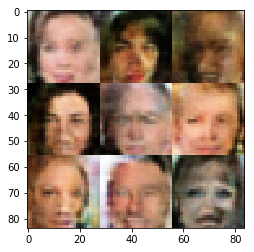

Epoch 1/1 Discriminator loss 0.5169 Generator loss 3.1734
Epoch 1/1 Discriminator loss 0.6928 Generator loss 2.3556


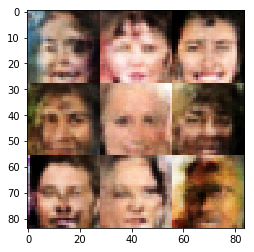

Epoch 1/1 Discriminator loss 0.5271 Generator loss 2.9198
Epoch 1/1 Discriminator loss 1.1457 Generator loss 0.7946


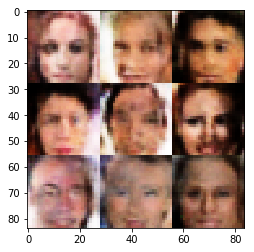

Epoch 1/1 Discriminator loss 0.9459 Generator loss 0.9409
Epoch 1/1 Discriminator loss 0.5312 Generator loss 2.7060


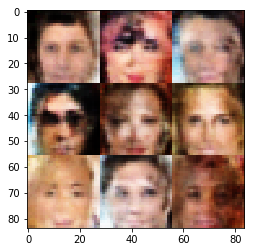

Epoch 1/1 Discriminator loss 1.0469 Generator loss 1.2152
Epoch 1/1 Discriminator loss 0.6257 Generator loss 2.5802


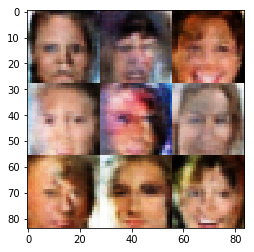

Epoch 1/1 Discriminator loss 1.3439 Generator loss 0.6004
Epoch 1/1 Discriminator loss 0.3840 Generator loss 6.9757


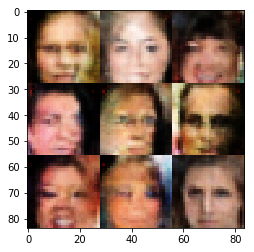

Epoch 1/1 Discriminator loss 0.6089 Generator loss 1.8479
Epoch 1/1 Discriminator loss 0.4657 Generator loss 3.3751


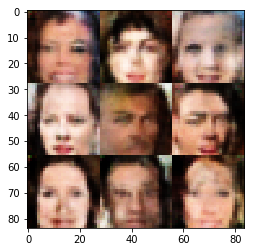

Epoch 1/1 Discriminator loss 0.3958 Generator loss 5.0238
Epoch 1/1 Discriminator loss 1.0173 Generator loss 2.3268


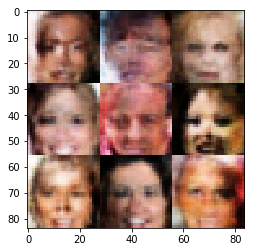

Epoch 1/1 Discriminator loss 1.0033 Generator loss 0.9266
Epoch 1/1 Discriminator loss 0.7357 Generator loss 1.3888


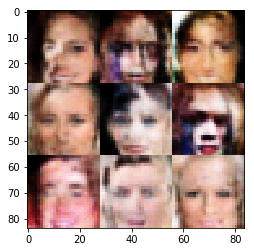

Epoch 1/1 Discriminator loss 0.5459 Generator loss 2.4017
Epoch 1/1 Discriminator loss 0.9490 Generator loss 1.0575


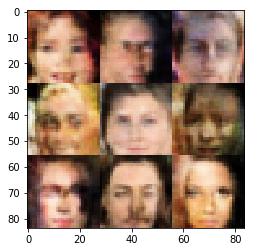

Epoch 1/1 Discriminator loss 0.8972 Generator loss 1.8270
Epoch 1/1 Discriminator loss 0.5381 Generator loss 2.7634


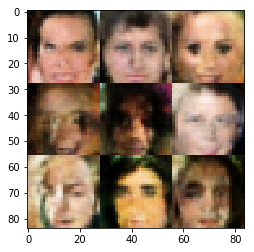

Epoch 1/1 Discriminator loss 0.6870 Generator loss 1.8678
Epoch 1/1 Discriminator loss 1.6055 Generator loss 2.0984


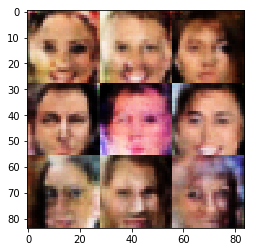

Epoch 1/1 Discriminator loss 1.1797 Generator loss 0.7565
Epoch 1/1 Discriminator loss 0.4107 Generator loss 4.7191


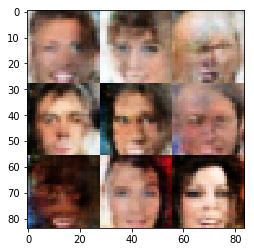

Epoch 1/1 Discriminator loss 0.5344 Generator loss 2.9307
Epoch 1/1 Discriminator loss 0.6655 Generator loss 1.4911


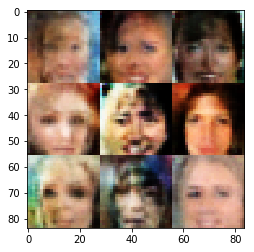

Epoch 1/1 Discriminator loss 0.5371 Generator loss 2.6001
Epoch 1/1 Discriminator loss 1.0240 Generator loss 2.0957


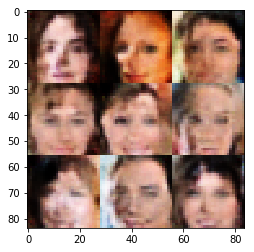

Epoch 1/1 Discriminator loss 1.3613 Generator loss 0.5703
Epoch 1/1 Discriminator loss 0.9397 Generator loss 1.0278


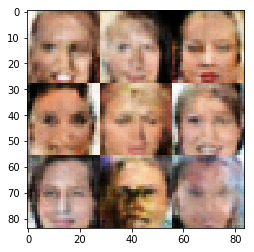

Epoch 1/1 Discriminator loss 0.7409 Generator loss 2.2215
Epoch 1/1 Discriminator loss 1.6025 Generator loss 0.5033


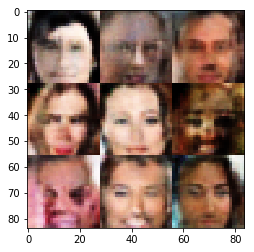

Epoch 1/1 Discriminator loss 0.9091 Generator loss 1.0165
Epoch 1/1 Discriminator loss 0.7611 Generator loss 1.6278


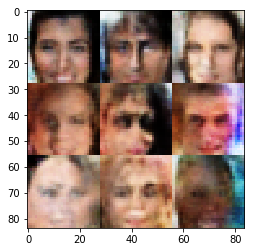

Epoch 1/1 Discriminator loss 0.7131 Generator loss 2.9133
Epoch 1/1 Discriminator loss 1.3158 Generator loss 0.7236


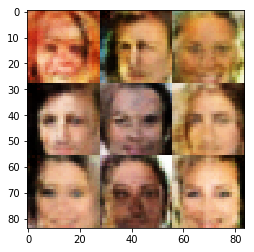

Epoch 1/1 Discriminator loss 0.5015 Generator loss 2.7706
Epoch 1/1 Discriminator loss 0.9380 Generator loss 1.0769


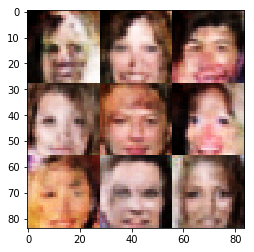

Epoch 1/1 Discriminator loss 1.2473 Generator loss 0.9188
Epoch 1/1 Discriminator loss 0.4933 Generator loss 3.0445


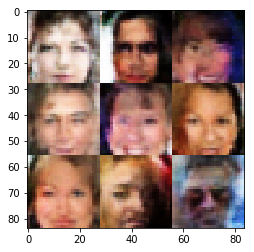

Epoch 1/1 Discriminator loss 0.6940 Generator loss 1.7789
Epoch 1/1 Discriminator loss 0.4479 Generator loss 3.7700


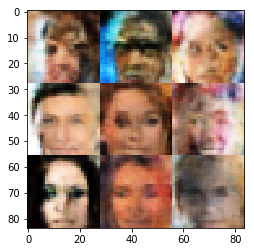

Epoch 1/1 Discriminator loss 0.6002 Generator loss 2.3723
Epoch 1/1 Discriminator loss 0.6179 Generator loss 2.0991


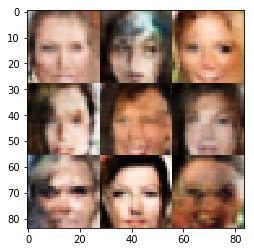

Epoch 1/1 Discriminator loss 0.7962 Generator loss 1.8938
Epoch 1/1 Discriminator loss 0.5637 Generator loss 3.4368


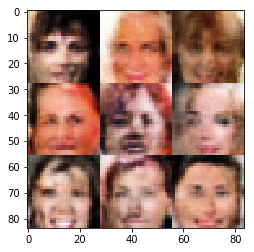

Epoch 1/1 Discriminator loss 0.5510 Generator loss 3.6519
Epoch 1/1 Discriminator loss 1.1036 Generator loss 0.8293


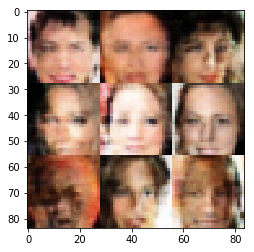

Epoch 1/1 Discriminator loss 0.3799 Generator loss 5.1524
Epoch 1/1 Discriminator loss 1.2036 Generator loss 1.1615


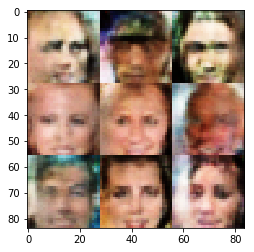

Epoch 1/1 Discriminator loss 0.8264 Generator loss 1.4955
Epoch 1/1 Discriminator loss 1.9616 Generator loss 0.2923


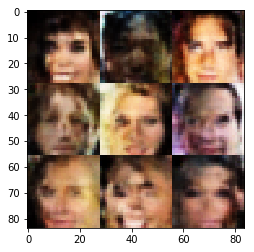

Epoch 1/1 Discriminator loss 0.7242 Generator loss 1.4989
Epoch 1/1 Discriminator loss 0.5314 Generator loss 2.4456


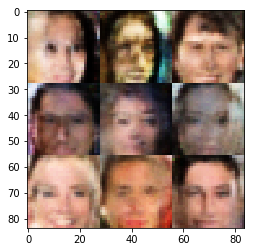

Epoch 1/1 Discriminator loss 0.4985 Generator loss 3.3932
Epoch 1/1 Discriminator loss 0.6334 Generator loss 2.8715


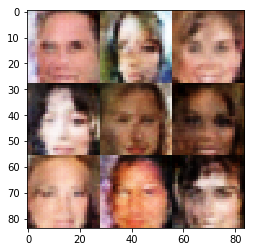

Epoch 1/1 Discriminator loss 0.9304 Generator loss 1.1521
Epoch 1/1 Discriminator loss 1.2221 Generator loss 0.7550


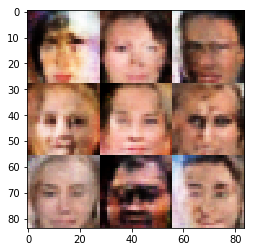

Epoch 1/1 Discriminator loss 0.9115 Generator loss 1.2087
Epoch 1/1 Discriminator loss 0.7583 Generator loss 1.6702


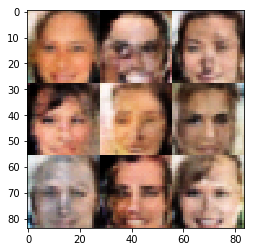

Epoch 1/1 Discriminator loss 0.8134 Generator loss 1.2695
Epoch 1/1 Discriminator loss 1.0911 Generator loss 0.8495


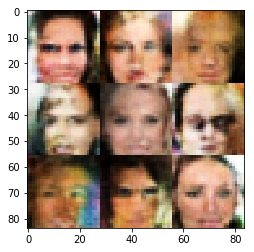

Epoch 1/1 Discriminator loss 0.6631 Generator loss 1.8240
Epoch 1/1 Discriminator loss 0.6160 Generator loss 2.1538


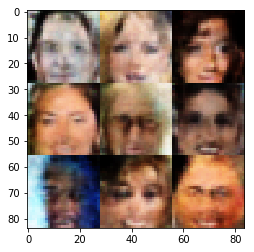

Epoch 1/1 Discriminator loss 0.4500 Generator loss 3.5349
Epoch 1/1 Discriminator loss 1.0564 Generator loss 1.5897


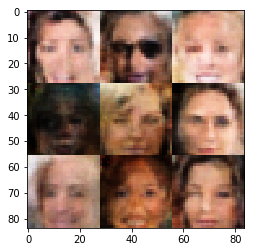

Epoch 1/1 Discriminator loss 0.8035 Generator loss 1.1694
Epoch 1/1 Discriminator loss 0.7626 Generator loss 1.4598


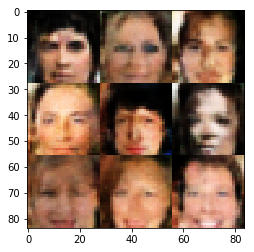

Epoch 1/1 Discriminator loss 0.6315 Generator loss 2.0315
Epoch 1/1 Discriminator loss 0.6591 Generator loss 2.2989


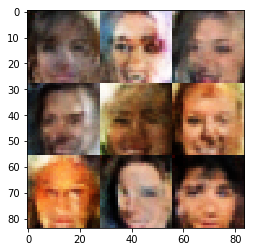

Epoch 1/1 Discriminator loss 1.6920 Generator loss 2.8964
Epoch 1/1 Discriminator loss 0.6302 Generator loss 2.6122


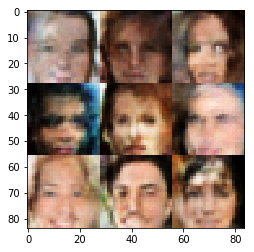

Epoch 1/1 Discriminator loss 0.8485 Generator loss 1.3768
Epoch 1/1 Discriminator loss 0.4790 Generator loss 3.8949


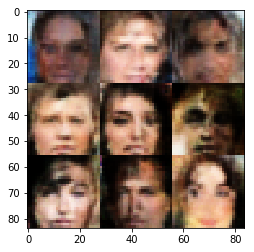

Epoch 1/1 Discriminator loss 0.6965 Generator loss 2.1281
Epoch 1/1 Discriminator loss 0.6419 Generator loss 3.4122


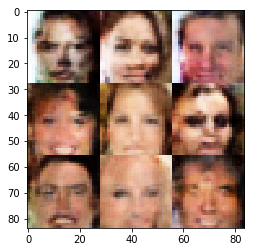

Epoch 1/1 Discriminator loss 0.5269 Generator loss 2.9192
Epoch 1/1 Discriminator loss 0.7602 Generator loss 2.1293


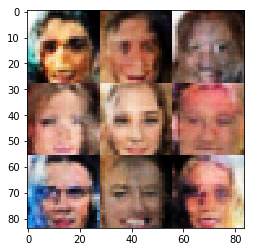

Epoch 1/1 Discriminator loss 1.2474 Generator loss 0.7602
Epoch 1/1 Discriminator loss 1.2527 Generator loss 0.6621


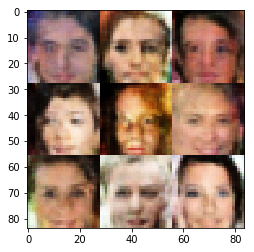

Epoch 1/1 Discriminator loss 0.8053 Generator loss 1.6399
Epoch 1/1 Discriminator loss 0.8262 Generator loss 1.2871


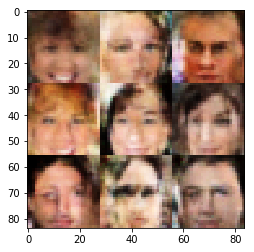

Epoch 1/1 Discriminator loss 0.9547 Generator loss 0.9736
Epoch 1/1 Discriminator loss 1.0163 Generator loss 1.0586


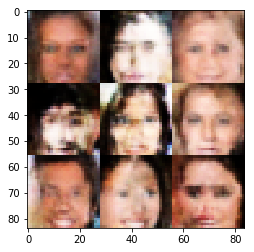

Epoch 1/1 Discriminator loss 1.0175 Generator loss 1.2475
Epoch 1/1 Discriminator loss 0.4540 Generator loss 4.1239


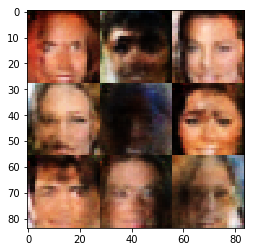

Epoch 1/1 Discriminator loss 0.5479 Generator loss 2.3937
Epoch 1/1 Discriminator loss 0.6904 Generator loss 1.9365


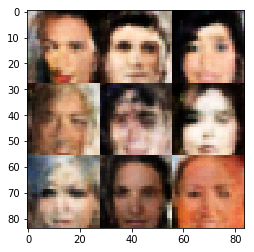

Epoch 1/1 Discriminator loss 0.8091 Generator loss 1.2461
Epoch 1/1 Discriminator loss 0.8215 Generator loss 1.3739


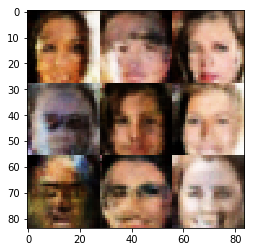

Epoch 1/1 Discriminator loss 0.9178 Generator loss 1.1335
Epoch 1/1 Discriminator loss 1.1254 Generator loss 1.1638


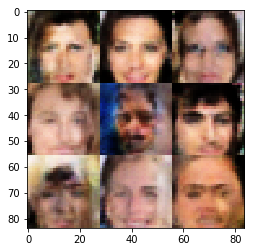

Epoch 1/1 Discriminator loss 0.6541 Generator loss 2.2604
Epoch 1/1 Discriminator loss 0.6442 Generator loss 1.8837


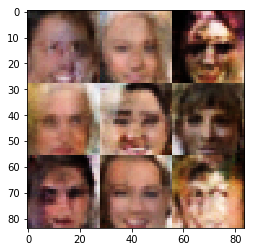

Epoch 1/1 Discriminator loss 0.7524 Generator loss 1.9079
Epoch 1/1 Discriminator loss 0.9513 Generator loss 0.9346


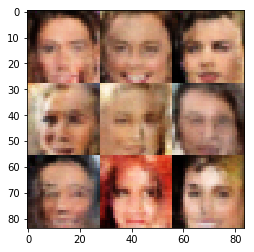

Epoch 1/1 Discriminator loss 0.5229 Generator loss 3.7349
Epoch 1/1 Discriminator loss 0.9828 Generator loss 1.4351


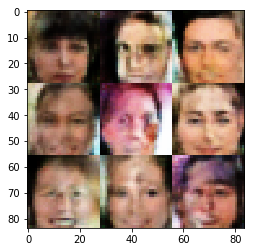

Epoch 1/1 Discriminator loss 1.1899 Generator loss 0.6863
Epoch 1/1 Discriminator loss 0.7295 Generator loss 1.5828


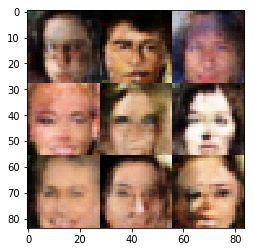

Epoch 1/1 Discriminator loss 0.7386 Generator loss 1.4692
Epoch 1/1 Discriminator loss 0.7530 Generator loss 2.5421


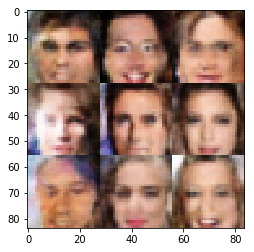

Epoch 1/1 Discriminator loss 0.7727 Generator loss 1.6385
Epoch 1/1 Discriminator loss 0.4263 Generator loss 4.5060


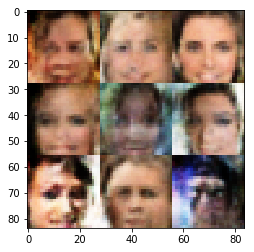

Epoch 1/1 Discriminator loss 0.4890 Generator loss 3.0495
Epoch 1/1 Discriminator loss 1.4503 Generator loss 0.5598


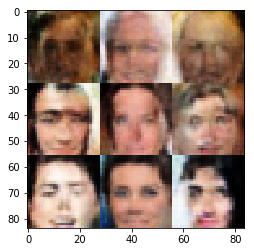

Epoch 1/1 Discriminator loss 0.8078 Generator loss 1.2720
Epoch 1/1 Discriminator loss 0.6144 Generator loss 1.8374


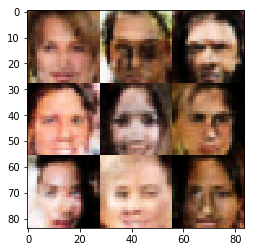

Epoch 1/1 Discriminator loss 0.8253 Generator loss 1.3160
Epoch 1/1 Discriminator loss 0.8383 Generator loss 1.4325


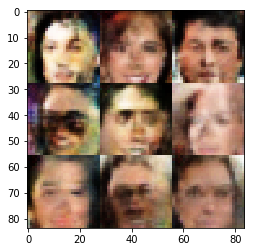

Epoch 1/1 Discriminator loss 0.5245 Generator loss 3.0011
Epoch 1/1 Discriminator loss 0.7255 Generator loss 2.0678


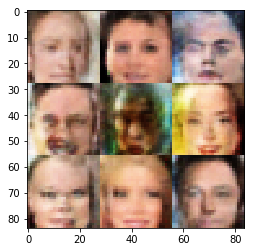

Epoch 1/1 Discriminator loss 0.3931 Generator loss 4.7326
Epoch 1/1 Discriminator loss 0.6619 Generator loss 1.8158


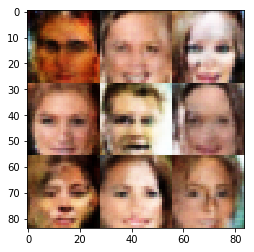

Epoch 1/1 Discriminator loss 0.9883 Generator loss 1.0387
Epoch 1/1 Discriminator loss 0.8287 Generator loss 1.2703


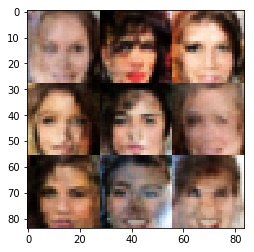

Epoch 1/1 Discriminator loss 0.5458 Generator loss 2.6338
Epoch 1/1 Discriminator loss 0.7842 Generator loss 1.2738


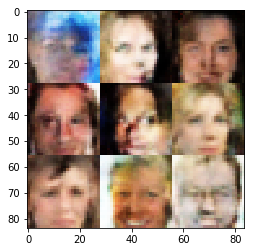

Epoch 1/1 Discriminator loss 0.8576 Generator loss 1.7517
Epoch 1/1 Discriminator loss 0.8868 Generator loss 1.5827


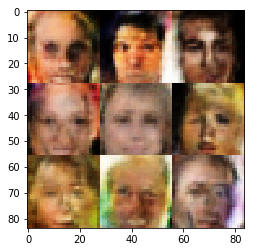

Epoch 1/1 Discriminator loss 0.8430 Generator loss 1.5184
Epoch 1/1 Discriminator loss 1.6751 Generator loss 0.3682


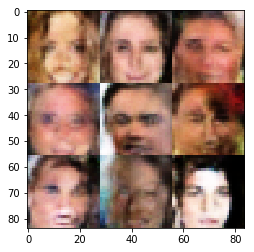

Epoch 1/1 Discriminator loss 0.7914 Generator loss 1.4568
Epoch 1/1 Discriminator loss 1.0162 Generator loss 0.9635


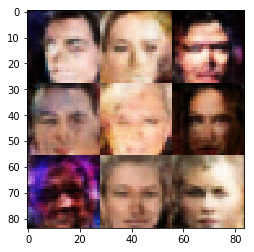

Epoch 1/1 Discriminator loss 1.0095 Generator loss 1.3455
Epoch 1/1 Discriminator loss 0.9761 Generator loss 1.0984


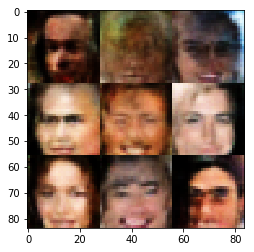

Epoch 1/1 Discriminator loss 1.5124 Generator loss 0.7289
Epoch 1/1 Discriminator loss 1.0884 Generator loss 2.7765


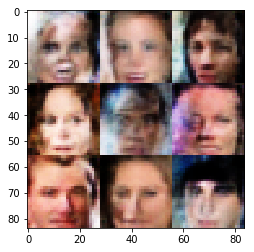

Epoch 1/1 Discriminator loss 0.5346 Generator loss 2.5853
Epoch 1/1 Discriminator loss 1.1377 Generator loss 0.8713


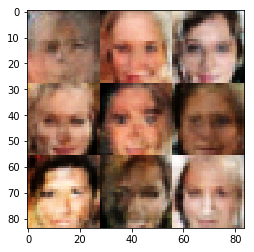

Epoch 1/1 Discriminator loss 0.7645 Generator loss 2.0498
Epoch 1/1 Discriminator loss 0.8844 Generator loss 1.2941


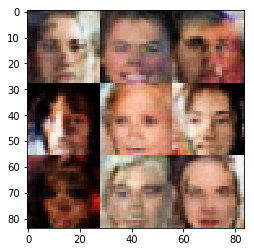

Epoch 1/1 Discriminator loss 1.0960 Generator loss 0.9734
Epoch 1/1 Discriminator loss 0.4903 Generator loss 4.1528


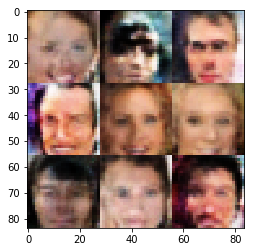

Epoch 1/1 Discriminator loss 1.0477 Generator loss 0.9208
Epoch 1/1 Discriminator loss 0.4313 Generator loss 3.3703


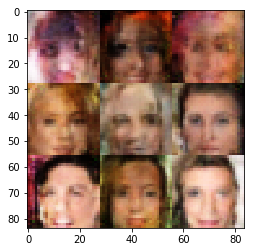

Epoch 1/1 Discriminator loss 0.9470 Generator loss 1.1488
Epoch 1/1 Discriminator loss 1.1787 Generator loss 0.7789


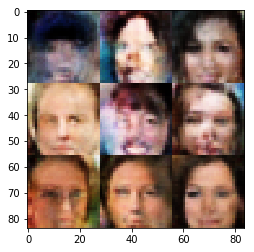

Epoch 1/1 Discriminator loss 0.4752 Generator loss 3.4492
Epoch 1/1 Discriminator loss 0.8585 Generator loss 1.1972


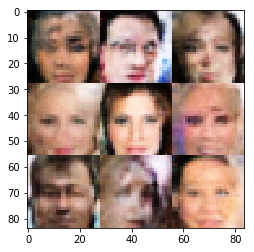

Epoch 1/1 Discriminator loss 0.8890 Generator loss 1.3558
Epoch 1/1 Discriminator loss 1.6097 Generator loss 0.4826


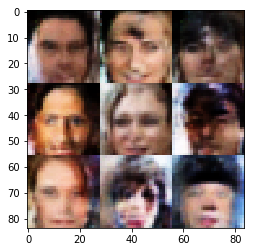

Epoch 1/1 Discriminator loss 0.5526 Generator loss 2.6372
Epoch 1/1 Discriminator loss 0.6784 Generator loss 2.3479


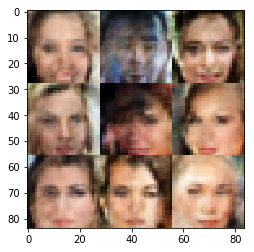

Epoch 1/1 Discriminator loss 0.6512 Generator loss 2.7438
Epoch 1/1 Discriminator loss 0.7808 Generator loss 2.2611


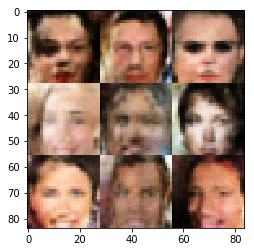

Epoch 1/1 Discriminator loss 0.4358 Generator loss 4.2496
Epoch 1/1 Discriminator loss 0.5591 Generator loss 3.6169


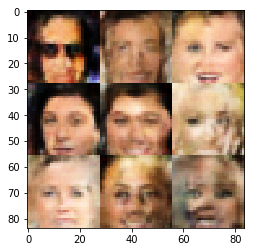

Epoch 1/1 Discriminator loss 0.7416 Generator loss 1.8204
Epoch 1/1 Discriminator loss 0.4910 Generator loss 2.7534


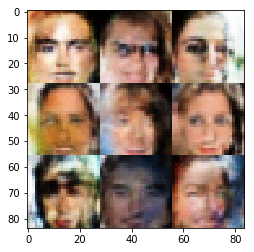

Epoch 1/1 Discriminator loss 1.0553 Generator loss 0.9455
Epoch 1/1 Discriminator loss 0.9080 Generator loss 1.0831


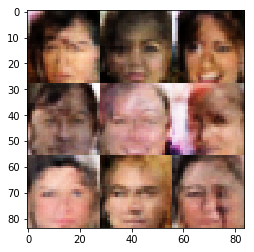

Epoch 1/1 Discriminator loss 0.7125 Generator loss 3.7706
Epoch 1/1 Discriminator loss 1.2713 Generator loss 0.6743


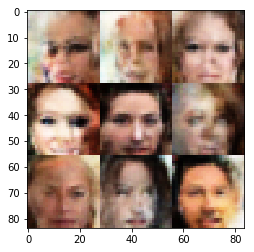

Epoch 1/1 Discriminator loss 1.0561 Generator loss 0.9476
Epoch 1/1 Discriminator loss 0.8100 Generator loss 1.5573


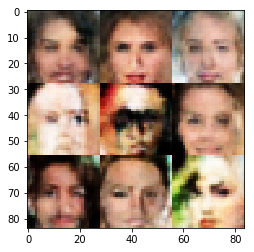

Epoch 1/1 Discriminator loss 0.7603 Generator loss 1.3750
Epoch 1/1 Discriminator loss 0.7499 Generator loss 1.6048


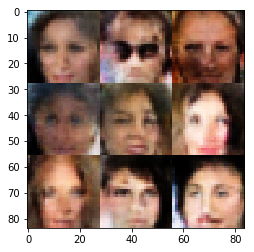

Epoch 1/1 Discriminator loss 0.9153 Generator loss 1.2537
Epoch 1/1 Discriminator loss 0.9507 Generator loss 0.9873


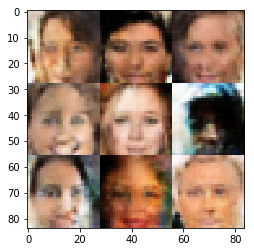

Epoch 1/1 Discriminator loss 0.5923 Generator loss 2.5881
Epoch 1/1 Discriminator loss 0.5382 Generator loss 2.3211


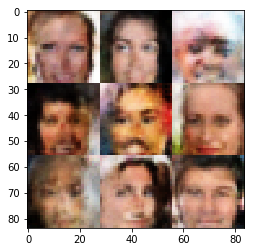

Epoch 1/1 Discriminator loss 0.7652 Generator loss 1.4666
Epoch 1/1 Discriminator loss 0.9176 Generator loss 1.2063


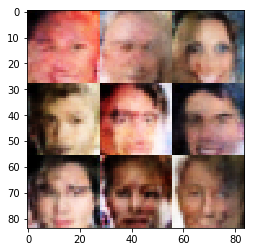

Epoch 1/1 Discriminator loss 0.8280 Generator loss 1.4745
Epoch 1/1 Discriminator loss 0.6143 Generator loss 2.0271


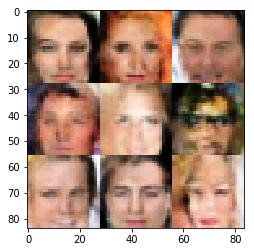

Epoch 1/1 Discriminator loss 1.0258 Generator loss 1.2059
Epoch 1/1 Discriminator loss 0.9084 Generator loss 1.9366


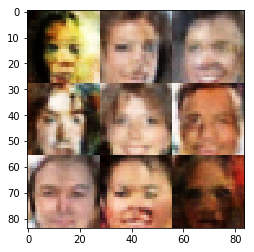

Epoch 1/1 Discriminator loss 0.8844 Generator loss 2.2511
Epoch 1/1 Discriminator loss 1.8492 Generator loss 0.3595


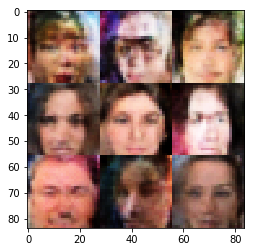

Epoch 1/1 Discriminator loss 1.9812 Generator loss 4.1101
Epoch 1/1 Discriminator loss 0.8126 Generator loss 1.8524


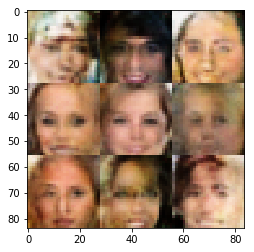

Epoch 1/1 Discriminator loss 0.8724 Generator loss 1.2872
Epoch 1/1 Discriminator loss 0.8528 Generator loss 1.6301


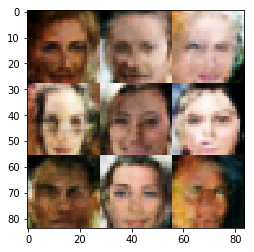

Epoch 1/1 Discriminator loss 0.6417 Generator loss 1.9898
Epoch 1/1 Discriminator loss 1.0604 Generator loss 0.9561


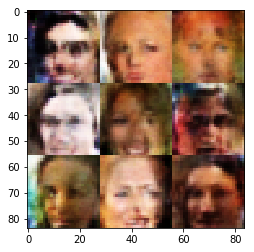

Epoch 1/1 Discriminator loss 0.5286 Generator loss 2.5052
Epoch 1/1 Discriminator loss 1.1577 Generator loss 0.8822


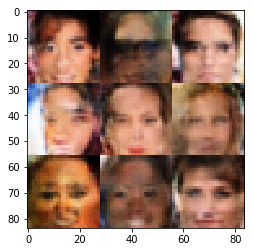

Epoch 1/1 Discriminator loss 0.5921 Generator loss 2.3314
Epoch 1/1 Discriminator loss 1.1737 Generator loss 0.7631


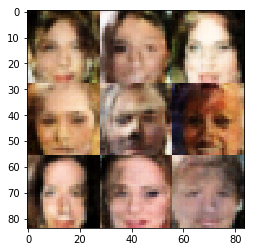

Epoch 1/1 Discriminator loss 0.8569 Generator loss 1.2439
Epoch 1/1 Discriminator loss 0.9768 Generator loss 1.7971


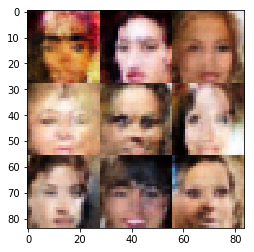

Epoch 1/1 Discriminator loss 1.4944 Generator loss 0.5714
Epoch 1/1 Discriminator loss 0.4282 Generator loss 3.4213


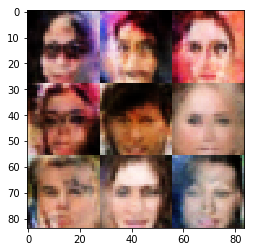

Epoch 1/1 Discriminator loss 0.6613 Generator loss 3.0092
Epoch 1/1 Discriminator loss 0.6297 Generator loss 2.1594


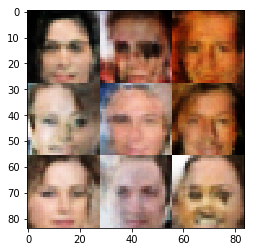

Epoch 1/1 Discriminator loss 0.6261 Generator loss 2.4215
Epoch 1/1 Discriminator loss 1.7277 Generator loss 0.3760


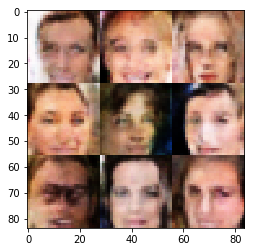

Epoch 1/1 Discriminator loss 0.4017 Generator loss 5.4371
Epoch 1/1 Discriminator loss 0.6496 Generator loss 2.0892


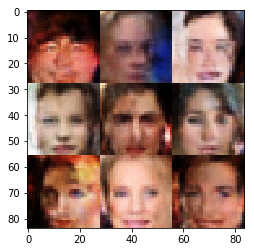

Epoch 1/1 Discriminator loss 0.7430 Generator loss 1.3399
Epoch 1/1 Discriminator loss 0.8851 Generator loss 2.5250


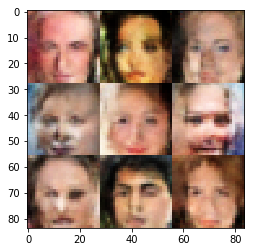

Epoch 1/1 Discriminator loss 0.7672 Generator loss 1.6266
Epoch 1/1 Discriminator loss 1.1821 Generator loss 1.6732


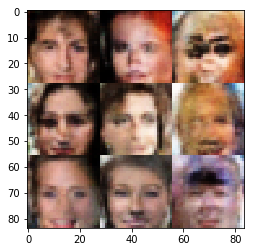

Epoch 1/1 Discriminator loss 0.9028 Generator loss 1.0314
Epoch 1/1 Discriminator loss 0.6702 Generator loss 2.5356


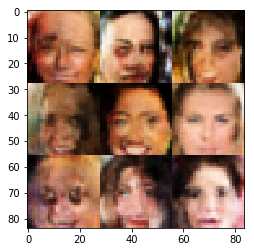

Epoch 1/1 Discriminator loss 0.4984 Generator loss 2.4694
Epoch 1/1 Discriminator loss 1.4116 Generator loss 1.1489


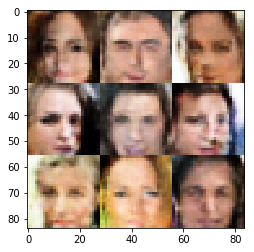

Epoch 1/1 Discriminator loss 0.6066 Generator loss 3.3999
Epoch 1/1 Discriminator loss 1.1193 Generator loss 0.8462


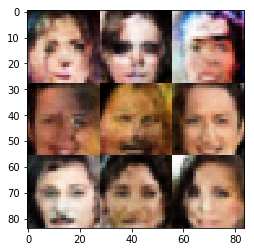

Epoch 1/1 Discriminator loss 0.6085 Generator loss 2.1968
Epoch 1/1 Discriminator loss 0.9661 Generator loss 1.2280


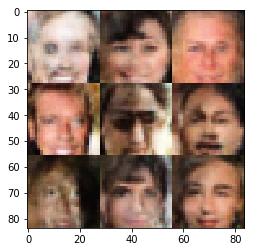

Epoch 1/1 Discriminator loss 1.2101 Generator loss 0.7020


IndexError: list index out of range

In [16]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
alpha = 0.2
beta1 = 0.5
real_size = (28,28,3) 



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    gan = GAN(real_size=real_size, z_size=z_dim, learning_rate=learning_rate, alpha=alpha, beta1=beta1)
    train(gan,epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.